# Demystifying Model Behavior: From Linear Truths to Hidden Variables

Welcome to this interactive notebook! In this space, we are going to explore exactly how machine learning models and explainability tools behave when we shift the underlying "ground truth" of our data. 

In the real world, we often feed data into an algorithm like XGBoost and hope it finds the true patterns. But how do we know *what* the model is actually learning? To answer this, we are going to play the role of the "Creator." We will generate synthetic datasets where **we know the exact mathematical equation** governing the target variable ($y$). 

By knowing the absolute, indisputable truth, we can test how well Traditional Statistics (OLS) and Machine Learning (XGBoost + SHAP) uncover that truth across three increasingly realistic scenarios.

## The Three Scenarios We Will Explore

We will run an end-to-end analytical pipeline—training, evaluating, and explaining—on the following three cases:

### Case 1: The Perfect World (Purely Linear Data)
* **The Reality:** The target $y$ is a simple, weighted sum of independent, visible variables (e.g., $y = 2.5x_1 - 1.2x_2$). 
* **The Goal:** Establish a baseline. We will see how perfectly both OLS and XGBoost capture simple additive relationships when the data is entirely transparent and linear.

### Case 2: The Complex World (Visible Interactions)
* **The Reality:** Features now interact with one another to influence the target (e.g., $y = 2x_1 + 3.4(x_2 \times x_3)$). 
* **The Goal:** Observe the divergence between traditional stats and machine learning. OLS will struggle to see the interaction without manual feature engineering, while XGBoost's tree structure will naturally map the multiplying effect. We'll use SHAP interaction values to crack open the model and visualize this behavior.

### Case 3: The Incomplete World (Hidden/Omitted Features)
* **The Reality:** We generate a complex dataset with interactions, but deliberately *hide* critical contributing features from the model. 
* **The Goal:** Mimic messy, real-world scenarios where we simply lack all the necessary data. We will watch our evaluation metrics (like $R^2$ and RMSE) degrade, and use SHAP to see how the model tries (and often fails) to compensate for the missing puzzle pieces.

## Our Toolkit
To accomplish this, we will be utilizing:
* **Custom Generators:** `numpy` and `pandas` to build the exact mathematical equations.
* **Baseline Modeling:** `statsmodels` (OLS) for traditional statistical significance and coefficient mapping.
* **Predictive Modeling:** `xgboost` to capture non-linearities and complex interactions.
* **Explainability:** `shap` (SHapley Additive exPlanations) to trace global feature importance, local impacts, and specific variable interactions.

In [1]:

from continuous_to_continuous import *
import time


c:\Users\User\anaconda3\envs\lior_XAI\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## simple linear combination test

### make example data 1

In [2]:

# 1. Setup & Data
X, y, feature_names, true_linear_weights = generate_linear_synthetic_data(
        num_inputs=10, 
        num_samples=5000, 
        num_contributing_features=(2, 5),
        input_range=(-1.0, 1.0), 
        weight_range=(-3, 3),
        noise_std=0.05,
    )

# Split data here so both OLS and XGBoost train on the exact same subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


--- Generative Model Info ---
Number of contributing variables (M): 3

--- True Mathematical Equation ---
y = (2.5965 * Feature_1) + (-2.5113 * Feature_8) + (1.0132 * Feature_9) + Noise(0, 0.05)
---------------------------------------



### make the Traditional Baseline (OLS)


--- Traditional OLS Regression (NaN Strategy: impute_mean) ---
Bonferroni correction applied: Adjusted p-value threshold = 5.0000e-03
                            OLS Regression Results                            
Dep. Variable:              Feature_9   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 7.350e+05
Date:                Sun, 24 May 2026   Prob (F-statistic):               0.00
Time:                        14:53:49   Log-Likelihood:                 6291.7
No. Observations:                4000   AIC:                        -1.256e+04
Df Residuals:                    3989   BIC:                        -1.249e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.9

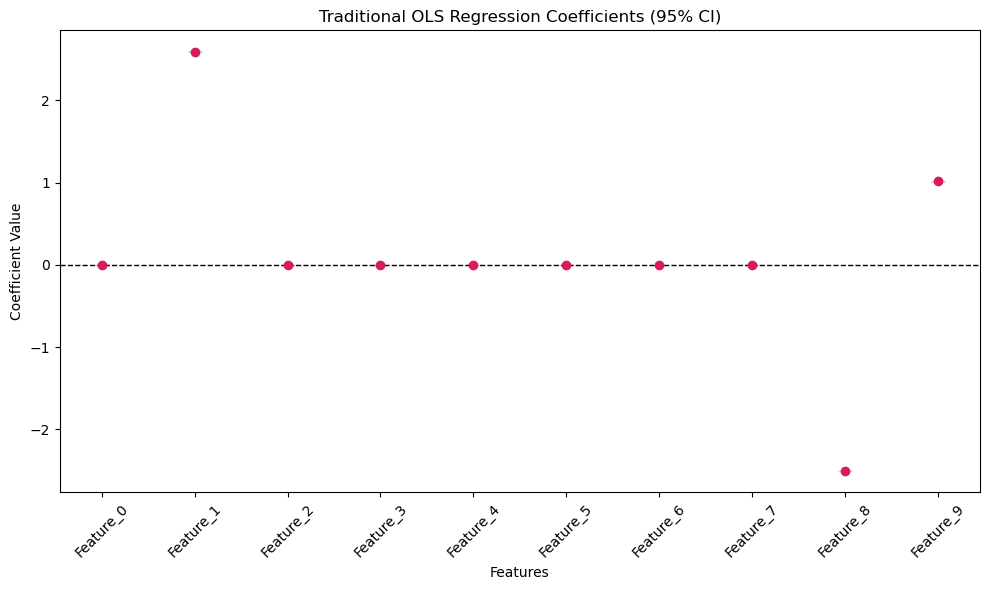

OLS Significant Features: {'Feature_1': {'pvalue': 0.0, 'coefficient': 2.5950313628596993}, 'Feature_8': {'pvalue': 0.0, 'coefficient': -2.5096920364932744}, 'Feature_9': {'pvalue': 0.0, 'coefficient': 1.0153666509693167}}


In [3]:

# 2. Traditional Baseline (OLS)
ols_model, significant_features = perform_traditional_regression(X_train, y_train)

print("OLS Significant Features:", significant_features)


#### test Traditional Baseline (OLS) results

In [4]:

print("Testing Traditional Baseline (OLS):")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, {}) # No interaction weights in this test

# print("Testing String Input:")
# metrics2 = evaluate_feature_discovery(list(significant_features.keys()), true_linear_weights, true_interaction_weights)

# metrics

Testing Traditional Baseline (OLS):

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 3
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 0
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 3 -> ['Feature_8', 'Feature_1', 'Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 3/3)
  └─ Interact Recall: 1.0000  (Found 0/0)
F1-Score:             1.0000
Rank Correlation:     -0.5000 (p-val: 0.6667)



### make a simple xgboost model for test 1

In [5]:

# 3. Machine Learning Modeling (XGBoost)
# We pass the pre-split data directly to ensure apples-to-apples comparison
model = xgb.XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1,base_score=np.mean(y_train))
model.fit(X_train, y_train)

# Evaluate the XGBoost Model on the test set
evaluate_xgb_model(model, X_test, y_test)



--- XGBoost Performance (Testing) ---
R-squared Score:                0.9965
Mean Squared Error (MSE):       0.0170
Root Mean Squared Error (RMSE): 0.1303
Mean Absolute Error (MAE):      0.1034
-------------------------------------



### look at XGBoost Native Importances

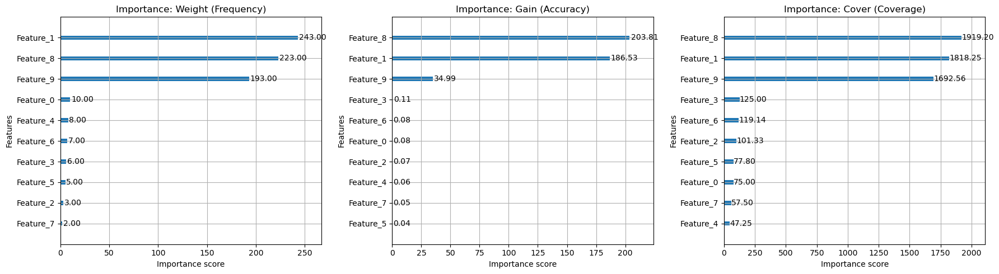

XGBoost Weight Importance: {'Feature_0': 10.0, 'Feature_1': 243.0, 'Feature_2': 3.0, 'Feature_3': 6.0, 'Feature_4': 8.0, 'Feature_5': 5.0, 'Feature_6': 7.0, 'Feature_7': 2.0, 'Feature_8': 223.0, 'Feature_9': 193.0}
XGBoost Gain Importance: {'Feature_0': 0.0799243375658989, 'Feature_1': 186.5314178466797, 'Feature_2': 0.0658087506890297, 'Feature_3': 0.10731684416532516, 'Feature_4': 0.06038180738687515, 'Feature_5': 0.04323548451066017, 'Feature_6': 0.08222876489162445, 'Feature_7': 0.05137118697166443, 'Feature_8': 203.8133087158203, 'Feature_9': 34.98530960083008}
XGBoost Cover Importance: {'Feature_0': 75.0, 'Feature_1': 1818.2509765625, 'Feature_2': 101.33333587646484, 'Feature_3': 125.0, 'Feature_4': 47.25, 'Feature_5': 77.80000305175781, 'Feature_6': 119.14286041259766, 'Feature_7': 57.5, 'Feature_8': 1919.197265625, 'Feature_9': 1692.5595703125}


In [6]:

# 4. XGBoost Native Importances
weight_importance, gain_importance, cover_importance = plot_all_xgb_importances(model)

print("XGBoost Weight Importance:", weight_importance)
print("XGBoost Gain Importance:", gain_importance)
print("XGBoost Cover Importance:", cover_importance)


#### test XGBoost Native Importances results

In [7]:

C = -0.5 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = weight_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing weight_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, {}) # No interaction weights in this test

significant_features = gain_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing gain_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, {}) # No interaction weights in this test

significant_features = cover_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing cover_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, {}) # No interaction weights in this test



Testing weight_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 3
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 0
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 3 -> ['Feature_8', 'Feature_1', 'Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 3/3)
  └─ Interact Recall: 1.0000  (Found 0/0)
F1-Score:             1.0000
Rank Correlation:     1.0000 (p-val: 0.0000)

Testing gain_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 3
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 0
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 3 -> ['Feature_8', 'Feature_1', 'Feature_9']
False Positives (Noise

### try to use SHAP to find the influencing inputs

In [8]:

# 5. Explainability (SHAP)
shap_values = compute_shap_values(model, X_train, X_test)

print("SHAP Values:", shap_values)


SHAP Values: .values =
array([[ 7.6870766e-04,  1.6314049e+00,  6.2126601e-05, ...,
         6.9739122e-05,  9.7565943e-01,  9.4938087e-01],
       [-1.9123896e-04, -1.9965260e+00,  4.1579202e-05, ...,
         1.9956262e-05,  9.3442947e-01, -9.2409641e-01],
       [ 8.7469292e-05,  1.7190052e+00, -2.8365826e-05, ...,
        -1.5428970e-05,  1.0804933e+00,  2.6695270e-02],
       ...,
       [ 3.3307399e-05,  1.2057401e+00, -2.8365826e-05, ...,
        -1.5428970e-05, -1.9987785e+00, -6.2704533e-01],
       [ 1.6954154e-04,  2.3596749e+00, -2.8365826e-05, ...,
        -1.5428970e-05,  5.3486091e-01,  8.4913093e-01],
       [ 4.0412620e-03,  2.4723680e+00,  9.6488155e-05, ...,
         1.5147006e-03,  1.4496874e+00,  9.0815187e-01]], dtype=float32)

.base_values =
array([0.03079128, 0.03079128, 0.03079128, 0.03079128, 0.03079128,
       0.03079128, 0.03079128, 0.03079128, 0.03079128, 0.03079128,
       0.03079128, 0.03079128, 0.03079128, 0.03079128, 0.03079128,
       0.03079128, 0.030

#### individual SHAP features ranking

Plotting SHAP analysis for top 5 features: ['Feature_1', 'Feature_8', 'Feature_9', 'Feature_0', 'Feature_3']


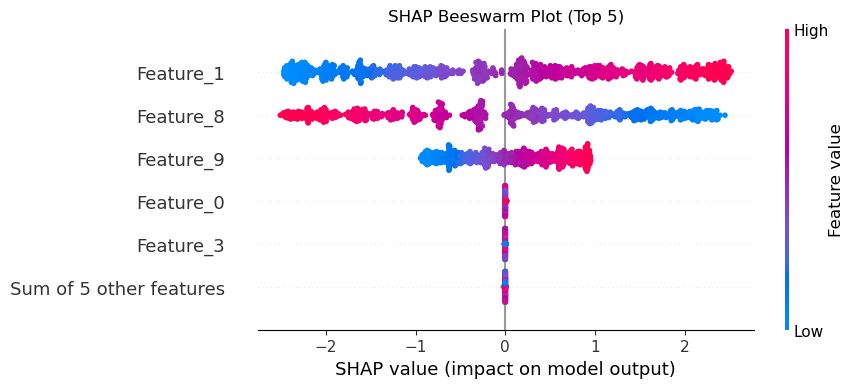

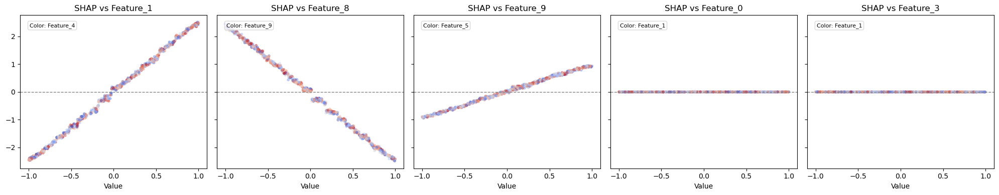

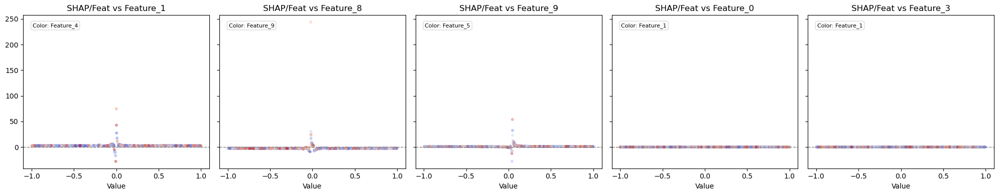

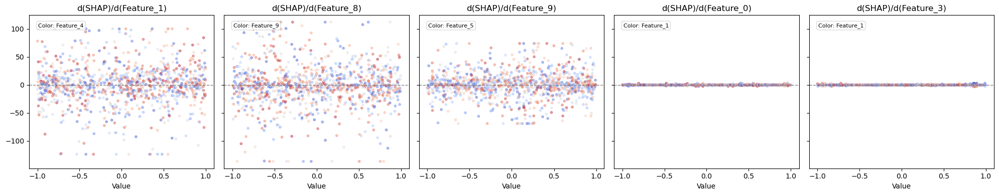

In [9]:

# 6. Visualization (SHAP)
plot_shap_analysis(shap_values, feature_names)


#### try to look for feature interactions
we shouldn't see any


--- Computing SHAP Interaction Values ---


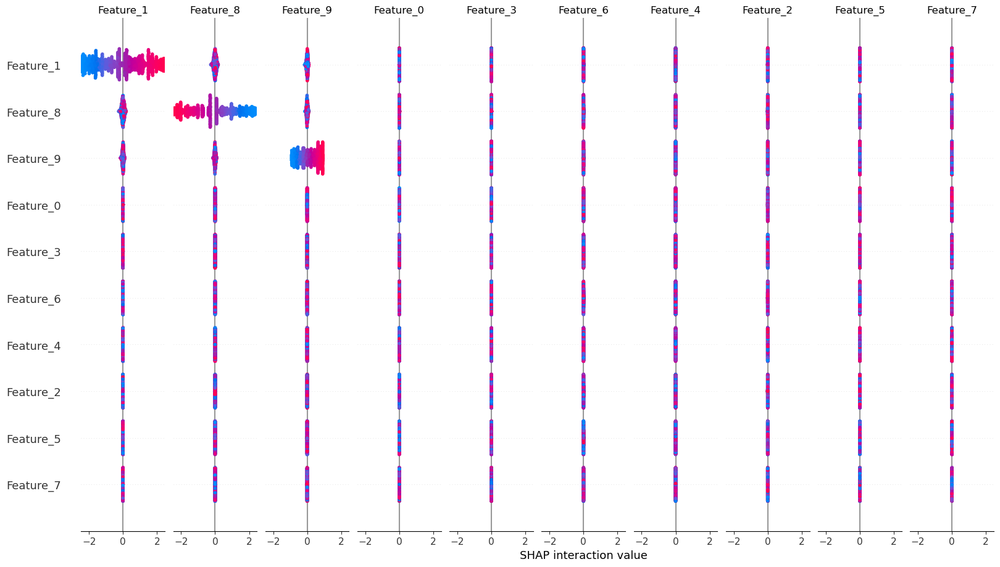


Strongest Interaction found by SHAP: Feature_1 & Feature_8
Plotting pure interaction effect for Feature_1 and Feature_8...


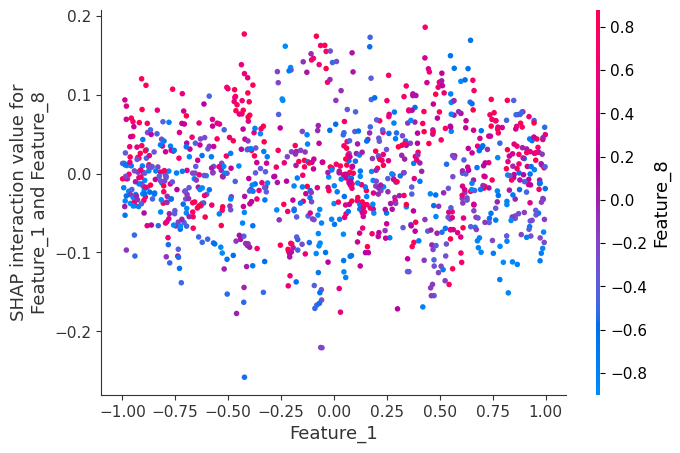


--- SHAP Interaction Feature Importance Ranking ---
Top 10 Strongest Interactions:
  Feature_1 * Feature_8: 0.0529
  Feature_1 * Feature_9: 0.0287
  Feature_8 * Feature_9: 0.0263
  Feature_6 * Feature_9: 0.0004
  Feature_1 * Feature_3: 0.0004
  Feature_3 * Feature_8: 0.0004
  Feature_0 * Feature_9: 0.0004
  Feature_0 * Feature_8: 0.0003
  Feature_6 * Feature_8: 0.0003
  Feature_4 * Feature_9: 0.0003
-------------------------------------------------

SHAP Interaction Values: {'Feature_1 * Feature_8': 0.052896175533533096, 'Feature_1 * Feature_9': 0.028716491535305977, 'Feature_8 * Feature_9': 0.02628827467560768, 'Feature_6 * Feature_9': 0.00041518264333717525, 'Feature_1 * Feature_3': 0.0003699380613397807, 'Feature_3 * Feature_8': 0.00035739058512263, 'Feature_0 * Feature_9': 0.0003569542313925922, 'Feature_0 * Feature_8': 0.00028392786043696105, 'Feature_6 * Feature_8': 0.0002798383648041636, 'Feature_4 * Feature_9': 0.0002790319558698684, 'Feature_0 * Feature_1': 0.0002366819244343

In [10]:

# 7. Deep Dive: SHAP Interaction Analysis
# Note: X_test must be a DataFrame or numpy array. We use X_test directly.
sorted_interactions = analyze_shap_interactions(model, X_test, feature_names)

print("SHAP Interaction Values:", sorted_interactions)


#### SHAP summry

In [11]:

# 8. Summary (SHAP)
ranked_features = print_feature_importance(shap_values)

print("Ranked Features by SHAP Importance:", ranked_features)



--- SHAP Feature Importance Ranking ---
SHAP Global Importance Dictionary:
  Feature_1: 1.3130
  Feature_8: 1.2678
  Feature_9: 0.4954
  Feature_0: 0.0004
  Feature_3: 0.0003
  Feature_6: 0.0003
  Feature_4: 0.0002
  Feature_2: 0.0001
  Feature_5: 0.0001
  Feature_7: 0.0001

Ranked Features (Most to Least Important):
['Feature_1', 'Feature_8', 'Feature_9', 'Feature_0', 'Feature_3', 'Feature_6', 'Feature_4', 'Feature_2', 'Feature_5', 'Feature_7']
---------------------------------------

Ranked Features by SHAP Importance: {'Feature_1': 1.3130143, 'Feature_8': 1.2678331, 'Feature_9': 0.4954477, 'Feature_0': 0.00035581787, 'Feature_3': 0.00031064835, 'Feature_6': 0.00026803798, 'Feature_4': 0.0001577204, 'Feature_2': 9.290746e-05, 'Feature_5': 8.4167055e-05, 'Feature_7': 6.13382e-05}


#### test SHAP Importances results

In [12]:
C = -0.5 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = ranked_features
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, {}) # No interaction weights in this test



Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 3
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 0
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 3 -> ['Feature_8', 'Feature_1', 'Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 3/3)
  └─ Interact Recall: 1.0000  (Found 0/0)
F1-Score:             1.0000
Rank Correlation:     1.0000 (p-val: 0.0000)



### SHAP STATISTICAL VALIDATION

#### Permutation Test

In [13]:
shap_pvalues = compute_shap_pvalues(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    true_shap_values=shap_values, 
    feature_names=feature_names, 
    n_permutations=50 # Increase to 100 or 500 for more robust (but slower) results
)

print("SHAP Feature P-values:", shap_pvalues)



--- Calculating Empirical SHAP p-values (Permutations: 50) ---

SHAP Empirical P-values (< 0.05 is statistically significant):
  - Feature_1: 0.0196 *
  - Feature_8: 0.0196 *
  - Feature_9: 0.0196 *
  - Feature_0: 1.0000 
  - Feature_2: 1.0000 
  - Feature_3: 1.0000 
  - Feature_4: 1.0000 
  - Feature_5: 1.0000 
  - Feature_6: 1.0000 
  - Feature_7: 1.0000 
----------------------------------------------------

SHAP Feature P-values: {'Feature_1': 0.0196078431372549, 'Feature_8': 0.0196078431372549, 'Feature_9': 0.0196078431372549, 'Feature_0': 1.0, 'Feature_2': 1.0, 'Feature_3': 1.0, 'Feature_4': 1.0, 'Feature_5': 1.0, 'Feature_6': 1.0, 'Feature_7': 1.0}


In [14]:

p_threshold = 0.05 # Adjust this threshold to be more or less strict in filtering features based on p-values

significant_features = ranked_features
# get only values where p-value < p_threshold (e.g., 0.05)
significant_features = {k: v for k, v in significant_features.items() if shap_pvalues.get(k, 1.0) < p_threshold}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, {}) # No interaction weights in this test


Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 3
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 0
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 3 -> ['Feature_8', 'Feature_1', 'Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 3/3)
  └─ Interact Recall: 1.0000  (Found 0/0)
F1-Score:             1.0000
Rank Correlation:     1.0000 (p-val: 0.0000)



#### Boruta Method

In [15]:
shadow_results = compute_shap_shadow_features(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    feature_names=feature_names
)

print("SHAP Shadow Feature Results:", shadow_results)



--- Running SHAP Shadow Feature Analysis ---
Maximum Shadow Feature Importance (Noise Threshold): 0.0014

Shadow Feature Significance Results:
  - Feature_0: 0.0002 -> FAILED (Noise)
  - Feature_1: 1.3140 -> PASSED (Significant)
  - Feature_2: 0.0001 -> FAILED (Noise)
  - Feature_3: 0.0002 -> FAILED (Noise)
  - Feature_4: 0.0000 -> FAILED (Noise)
  - Feature_5: 0.0001 -> FAILED (Noise)
  - Feature_6: 0.0003 -> FAILED (Noise)
  - Feature_7: 0.0000 -> FAILED (Noise)
  - Feature_8: 1.2679 -> PASSED (Significant)
  - Feature_9: 0.4951 -> PASSED (Significant)
----------------------------------------------

SHAP Shadow Feature Results: {'Feature_0': False, 'Feature_1': True, 'Feature_2': False, 'Feature_3': False, 'Feature_4': False, 'Feature_5': False, 'Feature_6': False, 'Feature_7': False, 'Feature_8': True, 'Feature_9': True}


In [16]:

significant_features = ranked_features
# get only values where shadow_results indicate significance (e.g., shadow_results[f] == True)
significant_features = {k: v for k, v in significant_features.items() if shadow_results.get(k, False)}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, {}) # No interaction weights in this test

Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 3
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 0
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 3 -> ['Feature_8', 'Feature_1', 'Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 3/3)
  └─ Interact Recall: 1.0000  (Found 0/0)
F1-Score:             1.0000
Rank Correlation:     1.0000 (p-val: 0.0000)



#### Confidence Intervals

In [17]:
bootstrap_results = compute_shap_bootstrapping(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    feature_names=feature_names,
    n_bootstraps=30 # Adjust based on how long you want to wait
)

print("SHAP Bootstrapping Results:", bootstrap_results)



--- Running SHAP Bootstrapping Analysis (Iterations: 30) ---

SHAP Bootstrapped 95% Confidence Intervals:
  - Feature_1: 1.3090 (95% CI: [1.2965, 1.3270])
  - Feature_8: 1.2694 (95% CI: [1.2561, 1.2814])
  - Feature_9: 0.4880 (95% CI: [0.4835, 0.4940])
  - Feature_4: 0.0007 (95% CI: [0.0002, 0.0021])
  - Feature_2: 0.0006 (95% CI: [0.0002, 0.0012])
  - Feature_6: 0.0006 (95% CI: [0.0001, 0.0011])
  - Feature_7: 0.0005 (95% CI: [0.0001, 0.0013])
  - Feature_0: 0.0005 (95% CI: [0.0001, 0.0013])
  - Feature_3: 0.0005 (95% CI: [0.0001, 0.0010])
  - Feature_5: 0.0004 (95% CI: [0.0001, 0.0010])
-------------------------------------------------------

SHAP Bootstrapping Results: {'Feature_1': (1.308986449241638, 1.2964682102203369, 1.3270315647125244), 'Feature_8': (1.2693604111671448, 1.2561255782842635, 1.2814339756965638), 'Feature_9': (0.48804235259691875, 0.4834753267467022, 0.4939905695617199), 'Feature_4': (0.000696336721496967, 0.00016439666869700887, 0.0020721759501611805), 'Feature

## test for linear combination with some feature interactions

### make example data 2

In [18]:

# 1. Setup & Data
X, y, feature_names, true_linear_weights, true_interaction_weights = generate_synthetic_data_with_interactions(
    num_inputs=10, 
    num_samples=5000, 
    num_contributing_features=(2, 5), 
    input_range=(-1.0, 1.0),
    weight_range=(-3, 3),
    num_interactions=(1, 2),
    interaction_weight_range=(-3, 3),
    noise_std=0.05,
)

# Split data here so both OLS and XGBoost train on the exact same subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


--- Generative Model Info (With Interactions) ---
Number of linear variables (M): 5
Number of interaction terms: 1

--- True Mathematical Equation ---
y = (-2.6565 * Feature_0) + (-2.4205 * Feature_1) + (-1.7470 * Feature_9) + (-1.6486 * Feature_5) + (0.3492 * Feature_2) + (-0.7175 * Feature_5 * Feature_6) + Noise(0, 0.05)
-------------------------------------------------



### make the Traditional Baseline (OLS)


--- Traditional OLS Regression (NaN Strategy: impute_mean) ---
Bonferroni correction applied: Adjusted p-value threshold = 5.0000e-03
                            OLS Regression Results                            
Dep. Variable:              Feature_2   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                 4.377e+04
Date:                Sun, 24 May 2026   Prob (F-statistic):               0.00
Time:                        14:54:13   Log-Likelihood:                 36.573
No. Observations:                4000   AIC:                            -51.15
Df Residuals:                    3989   BIC:                             18.09
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.9

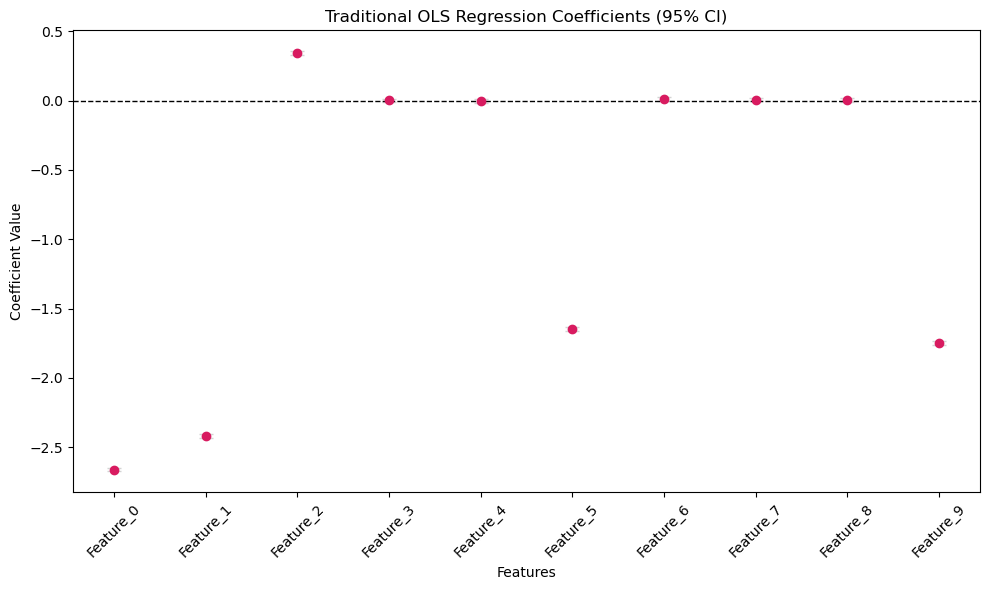

In [19]:

# 2. Traditional Baseline (OLS)
ols_model, significant_features = perform_traditional_regression(X_train, y_train)


#### test Traditional Baseline (OLS) results

In [20]:

print("Testing Traditional Baseline (OLS):")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

# print("Testing String Input:")
# metrics2 = evaluate_feature_discovery(list(significant_features.keys()), true_linear_weights, true_interaction_weights)

# metrics

Testing Traditional Baseline (OLS):

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 6
  ├─ Purely Linear / Main:     5
  └─ Involved in Interactions: 2
Total Model Features Found:    5
--------------------------------------------------
True Positives (Correct): 5 -> ['Feature_1', 'Feature_9', 'Feature_5', 'Feature_0', 'Feature_2']
False Positives (Noise):  0 -> []
False Negatives (Missed): 1 -> ['Feature_6']
--------------------------------------------------
Precision:            1.0000
Overall Recall:       0.8333
  ├─ Linear Recall:   1.0000  (Found 5/5)
  └─ Interact Recall: 0.5000  (Found 1/2)
F1-Score:             0.9091
Rank Correlation:     0.3000 (p-val: 0.6238)



### make a simple xgboost model for test 2

In [21]:

# 3. Machine Learning Modeling (XGBoost)
# We pass the pre-split data directly to ensure apples-to-apples comparison
model = xgb.XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1,base_score=np.mean(y_train))
model.fit(X_train, y_train)

# Evaluate the XGBoost Model on the test set
evaluate_xgb_model(model, X_test, y_test)
# 


--- XGBoost Performance (Testing) ---
R-squared Score:                0.9875
Mean Squared Error (MSE):       0.0797
Root Mean Squared Error (RMSE): 0.2823
Mean Absolute Error (MAE):      0.2236
-------------------------------------



### look at XGBoost Native Importances

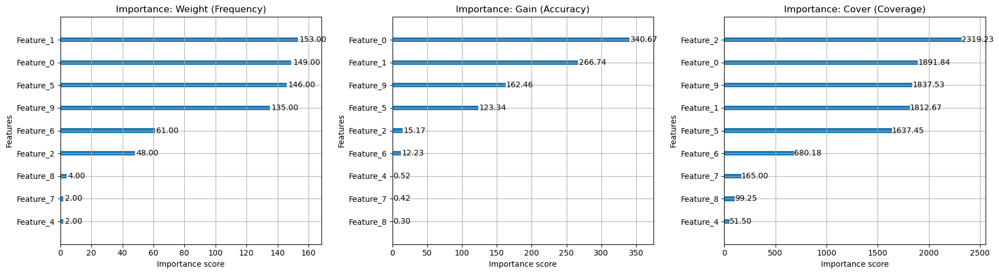

XGBoost Weight Importance: {'Feature_0': 149.0, 'Feature_1': 153.0, 'Feature_2': 48.0, 'Feature_4': 2.0, 'Feature_5': 146.0, 'Feature_6': 61.0, 'Feature_7': 2.0, 'Feature_8': 4.0, 'Feature_9': 135.0}
XGBoost Gain Importance: {'Feature_0': 340.6717834472656, 'Feature_1': 266.7371826171875, 'Feature_2': 15.17151165008545, 'Feature_4': 0.515740156173706, 'Feature_5': 123.33987426757812, 'Feature_6': 12.227938652038574, 'Feature_7': 0.4209047555923462, 'Feature_8': 0.29775992035865784, 'Feature_9': 162.45689392089844}
XGBoost Cover Importance: {'Feature_0': 1891.8388671875, 'Feature_1': 1812.6666259765625, 'Feature_2': 2319.229248046875, 'Feature_4': 51.5, 'Feature_5': 1637.4520263671875, 'Feature_6': 680.1802978515625, 'Feature_7': 165.0, 'Feature_8': 99.25, 'Feature_9': 1837.52587890625}


In [22]:

# 4. XGBoost Native Importances
weight_importance, gain_importance, cover_importance = plot_all_xgb_importances(model)

print("XGBoost Weight Importance:", weight_importance)
print("XGBoost Gain Importance:", gain_importance)
print("XGBoost Cover Importance:", cover_importance)


#### test XGBoost Native Importances results

In [23]:

C = -0.5 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = weight_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing weight_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = gain_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing gain_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = cover_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing cover_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing weight_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 6
  ├─ Purely Linear / Main:     5
  └─ Involved in Interactions: 2
Total Model Features Found:    6
--------------------------------------------------
True Positives (Correct): 6 -> ['Feature_1', 'Feature_9', 'Feature_5', 'Feature_0', 'Feature_2', 'Feature_6']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 5/5)
  └─ Interact Recall: 1.0000  (Found 2/2)
F1-Score:             1.0000
Rank Correlation:     0.9429 (p-val: 0.0048)

Testing gain_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 6
  ├─ Purely Linear / Main:     5
  └─ Involved in Interactions: 2
Total Model Features Found:    4
--------------------------------------------------
True Positives (Correct): 4 -> ['Feature_9', 'Feature_

### try to use SHAP to find the influencing inputs

In [24]:

# 5. Explainability (SHAP)
shap_values = compute_shap_values(model, X_train, X_test)


#### individual SHAP features ranking

Plotting SHAP analysis for top 5 features: ['Feature_0', 'Feature_1', 'Feature_9', 'Feature_5', 'Feature_2']


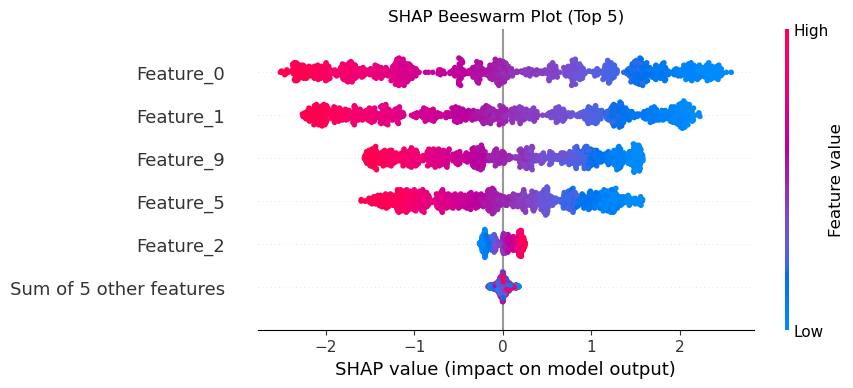

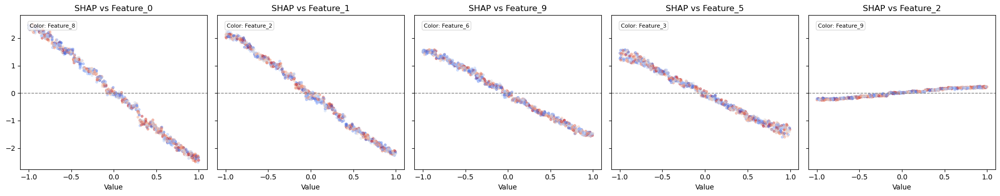

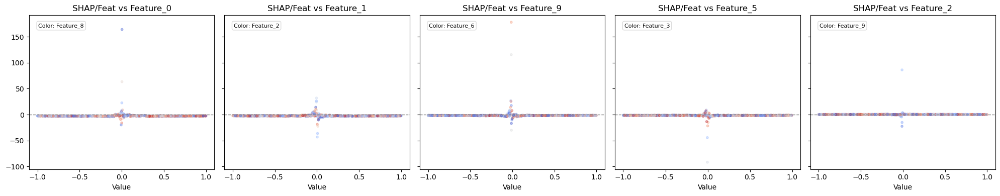

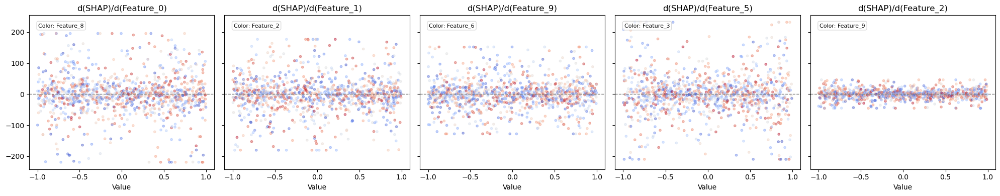

In [25]:

# 6. Visualization (SHAP)
plot_shap_analysis(shap_values, feature_names)


#### try to look for feature interactions
we should see some now


--- Computing SHAP Interaction Values ---


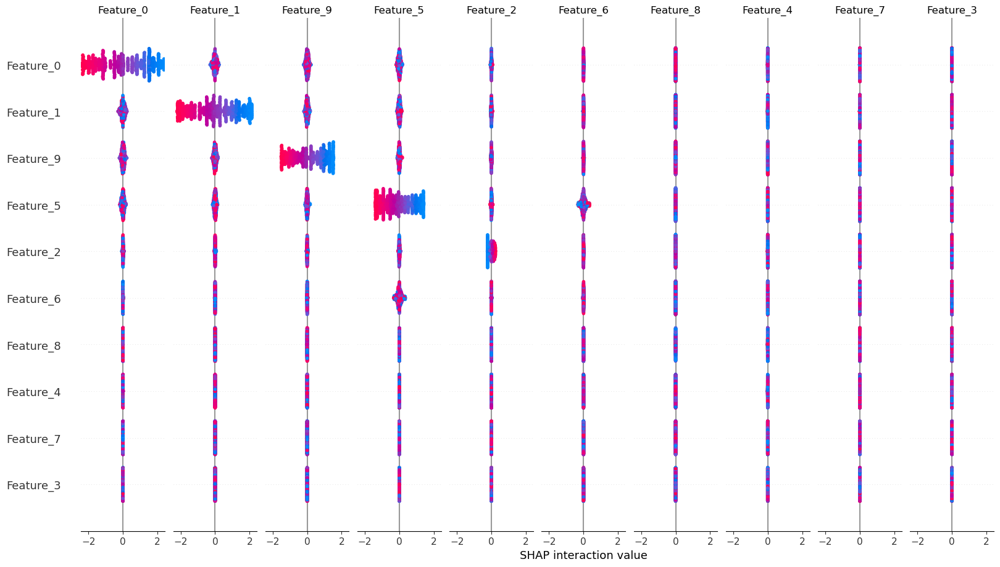


Strongest Interaction found by SHAP: Feature_5 & Feature_6
Plotting pure interaction effect for Feature_5 and Feature_6...


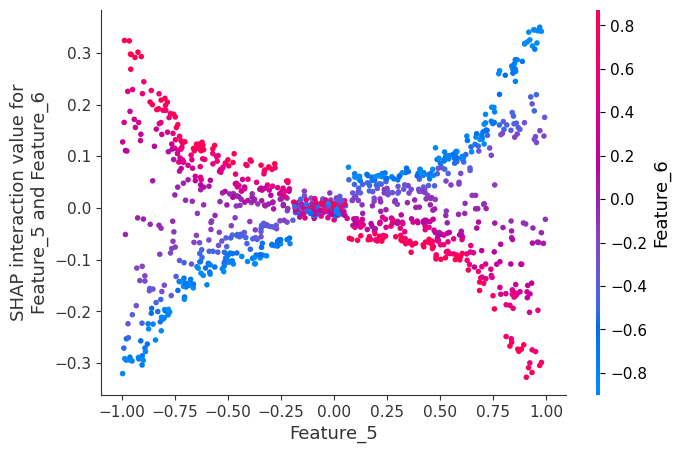


--- SHAP Interaction Feature Importance Ranking ---
Top 10 Strongest Interactions:
  Feature_5 * Feature_6: 0.0873
  Feature_0 * Feature_1: 0.0734
  Feature_0 * Feature_9: 0.0547
  Feature_1 * Feature_9: 0.0522
  Feature_0 * Feature_5: 0.0490
  Feature_1 * Feature_5: 0.0403
  Feature_5 * Feature_9: 0.0310
  Feature_2 * Feature_5: 0.0136
  Feature_1 * Feature_2: 0.0118
  Feature_2 * Feature_9: 0.0115
-------------------------------------------------

SHAP Interaction Values: {'Feature_5 * Feature_6': 0.0873129814863205, 'Feature_0 * Feature_1': 0.07338923960924149, 'Feature_0 * Feature_9': 0.054746683686971664, 'Feature_1 * Feature_9': 0.052219051867723465, 'Feature_0 * Feature_5': 0.04896707087755203, 'Feature_1 * Feature_5': 0.04026093706488609, 'Feature_5 * Feature_9': 0.031030038371682167, 'Feature_2 * Feature_5': 0.013594279997050762, 'Feature_1 * Feature_2': 0.011827325448393822, 'Feature_2 * Feature_9': 0.01149972528219223, 'Feature_0 * Feature_2': 0.010185721330344677, 'Feature

In [26]:

# 7. Deep Dive: SHAP Interaction Analysis
# Note: X_test must be a DataFrame or numpy array. We use X_test directly.
shap_interaction_values = analyze_shap_interactions(model, X_test, feature_names)

print("SHAP Interaction Values:", shap_interaction_values)


#### SHAP summry

In [27]:

# 8. Summary (SHAP)
ranked_features = print_feature_importance(shap_values)

print("Ranked Features by SHAP Importance:", ranked_features)



--- SHAP Feature Importance Ranking ---
SHAP Global Importance Dictionary:
  Feature_0: 1.3166
  Feature_1: 1.2032
  Feature_9: 0.8577
  Feature_5: 0.7616
  Feature_2: 0.1372
  Feature_6: 0.0441
  Feature_8: 0.0004
  Feature_4: 0.0002
  Feature_7: 0.0002
  Feature_3: 0.0000

Ranked Features (Most to Least Important):
['Feature_0', 'Feature_1', 'Feature_9', 'Feature_5', 'Feature_2', 'Feature_6', 'Feature_8', 'Feature_4', 'Feature_7', 'Feature_3']
---------------------------------------

Ranked Features by SHAP Importance: {'Feature_0': 1.3165593, 'Feature_1': 1.2031941, 'Feature_9': 0.8577092, 'Feature_5': 0.7615854, 'Feature_2': 0.13720533, 'Feature_6': 0.044053987, 'Feature_8': 0.00043087028, 'Feature_4': 0.00022010991, 'Feature_7': 0.00017857137, 'Feature_3': 0.0}


#### test SHAP Importances results

In [28]:
C = -0.5 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = ranked_features
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 6
  ├─ Purely Linear / Main:     5
  └─ Involved in Interactions: 2
Total Model Features Found:    4
--------------------------------------------------
True Positives (Correct): 4 -> ['Feature_5', 'Feature_9', 'Feature_0', 'Feature_1']
False Positives (Noise):  0 -> []
False Negatives (Missed): 2 -> ['Feature_2', 'Feature_6']
--------------------------------------------------
Precision:            1.0000
Overall Recall:       0.6667
  ├─ Linear Recall:   0.8000  (Found 4/5)
  └─ Interact Recall: 0.5000  (Found 1/2)
F1-Score:             0.8000
Rank Correlation:     0.8000 (p-val: 0.2000)



### SHAP STATISTICAL VALIDATION

#### Permutation Test

In [29]:
shap_pvalues = compute_shap_pvalues(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    true_shap_values=shap_values, 
    feature_names=feature_names, 
    n_permutations=50 # Increase to 100 or 500 for more robust (but slower) results
)

print("SHAP Feature P-values:", shap_pvalues)



--- Calculating Empirical SHAP p-values (Permutations: 50) ---

SHAP Empirical P-values (< 0.05 is statistically significant):
  - Feature_0: 0.0196 *
  - Feature_1: 0.0196 *
  - Feature_2: 0.0196 *
  - Feature_5: 0.0196 *
  - Feature_9: 0.0196 *
  - Feature_6: 0.8824 
  - Feature_3: 1.0000 
  - Feature_4: 1.0000 
  - Feature_7: 1.0000 
  - Feature_8: 1.0000 
----------------------------------------------------

SHAP Feature P-values: {'Feature_0': 0.0196078431372549, 'Feature_1': 0.0196078431372549, 'Feature_2': 0.0196078431372549, 'Feature_5': 0.0196078431372549, 'Feature_9': 0.0196078431372549, 'Feature_6': 0.8823529411764706, 'Feature_3': 1.0, 'Feature_4': 1.0, 'Feature_7': 1.0, 'Feature_8': 1.0}


In [30]:

p_threshold = 0.05 # Adjust this threshold to be more or less strict in filtering features based on p-values

significant_features = ranked_features
# get only values where p-value < p_threshold (e.g., 0.05)
significant_features = {k: v for k, v in significant_features.items() if shap_pvalues.get(k, 1.0) < p_threshold}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)


Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 6
  ├─ Purely Linear / Main:     5
  └─ Involved in Interactions: 2
Total Model Features Found:    5
--------------------------------------------------
True Positives (Correct): 5 -> ['Feature_1', 'Feature_9', 'Feature_5', 'Feature_0', 'Feature_2']
False Positives (Noise):  0 -> []
False Negatives (Missed): 1 -> ['Feature_6']
--------------------------------------------------
Precision:            1.0000
Overall Recall:       0.8333
  ├─ Linear Recall:   1.0000  (Found 5/5)
  └─ Interact Recall: 0.5000  (Found 1/2)
F1-Score:             0.9091
Rank Correlation:     0.9000 (p-val: 0.0374)



#### Boruta Method

In [31]:
shadow_results = compute_shap_shadow_features(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    feature_names=feature_names
)

print("SHAP Shadow Feature Results:", shadow_results)



--- Running SHAP Shadow Feature Analysis ---
Maximum Shadow Feature Importance (Noise Threshold): 0.0003

Shadow Feature Significance Results:
  - Feature_0: 1.3164 -> PASSED (Significant)
  - Feature_1: 1.2044 -> PASSED (Significant)
  - Feature_2: 0.1379 -> PASSED (Significant)
  - Feature_3: 0.0000 -> FAILED (Noise)
  - Feature_4: 0.0003 -> FAILED (Noise)
  - Feature_5: 0.7637 -> PASSED (Significant)
  - Feature_6: 0.0414 -> PASSED (Significant)
  - Feature_7: 0.0001 -> FAILED (Noise)
  - Feature_8: 0.0001 -> FAILED (Noise)
  - Feature_9: 0.8597 -> PASSED (Significant)
----------------------------------------------

SHAP Shadow Feature Results: {'Feature_0': True, 'Feature_1': True, 'Feature_2': True, 'Feature_3': False, 'Feature_4': False, 'Feature_5': True, 'Feature_6': True, 'Feature_7': False, 'Feature_8': False, 'Feature_9': True}


In [32]:

significant_features = ranked_features
# get only values where shadow_results indicate significance (e.g., shadow_results[f] == True)
significant_features = {k: v for k, v in significant_features.items() if shadow_results.get(k, False)}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 6
  ├─ Purely Linear / Main:     5
  └─ Involved in Interactions: 2
Total Model Features Found:    6
--------------------------------------------------
True Positives (Correct): 6 -> ['Feature_1', 'Feature_9', 'Feature_5', 'Feature_0', 'Feature_2', 'Feature_6']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 5/5)
  └─ Interact Recall: 1.0000  (Found 2/2)
F1-Score:             1.0000
Rank Correlation:     0.8857 (p-val: 0.0188)



#### Confidence Intervals

In [33]:
bootstrap_results = compute_shap_bootstrapping(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    feature_names=feature_names,
    n_bootstraps=30 # Adjust based on how long you want to wait
)

print("SHAP Bootstrapping Results:", bootstrap_results)



--- Running SHAP Bootstrapping Analysis (Iterations: 30) ---

SHAP Bootstrapped 95% Confidence Intervals:
  - Feature_0: 1.3128 (95% CI: [1.2973, 1.3333])
  - Feature_1: 1.2016 (95% CI: [1.1865, 1.2158])
  - Feature_9: 0.8464 (95% CI: [0.8324, 0.8568])
  - Feature_5: 0.7630 (95% CI: [0.7493, 0.7773])
  - Feature_2: 0.1300 (95% CI: [0.1193, 0.1379])
  - Feature_6: 0.0364 (95% CI: [0.0293, 0.0432])
  - Feature_4: 0.0006 (95% CI: [0.0001, 0.0018])
  - Feature_7: 0.0006 (95% CI: [0.0001, 0.0011])
  - Feature_8: 0.0005 (95% CI: [0.0001, 0.0017])
  - Feature_3: 0.0005 (95% CI: [0.0001, 0.0013])
-------------------------------------------------------

SHAP Bootstrapping Results: {'Feature_0': (1.3127543012301126, 1.297338530421257, 1.3332648277282715), 'Feature_1': (1.2015682617823282, 1.1865018665790559, 1.2158127397298812), 'Feature_9': (0.8464001794656117, 0.832393328845501, 0.8568033784627914), 'Feature_5': (0.7629501382509868, 0.7493030071258545, 0.7773305729031563), 'Feature_2': (0.129

## test for addition of hidden features

### make example data 3

In [34]:

# 1. Setup & Data
X, hidden_features, y, feature_names, hidden_feature_names, true_linear_weights, true_interaction_weights = generate_synthetic_data_with_hidden_features(
    num_inputs = 10, 
    num_samples = 5000, 
    num_contributing_features = (2, 5), 
    num_hidden_features = (1, 2), 
    input_range = (-1.0, 1.0),
    weight_range = (-3, 3), 
    num_interactions = (1, 2), 
    interaction_weight_range = (-3, 3), 
    noise_std = 0.05, 
    hidden_in_linear = True,           # Should hidden features have a linear impact?
    hidden_in_interactions = True,     # Should hidden features be part of interactions?
    missing_pct = 0.0,                 # 00% of the data will be missing (NaN)
    error_pct = 0.0,                   # 00% of the data will be corrupted
    )

# Split data here so both OLS and XGBoost train on the exact same subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


--- Generative Model Info (With HIDDEN Features) ---
Total linear variables:  2 (1 visible, 1 hidden)
Total interaction terms: 1 (0 pure visible, 1 involving hidden)

--- True Mathematical Equation ---
y = (-1.1366 * Feature_9) + (-0.5102 * Hidden_0) + (2.5498 * Feature_3 * Hidden_0) + Noise(0, 0.05)
----------------------------------------------------



### make the Traditional Baseline (OLS)


--- Traditional OLS Regression (NaN Strategy: impute_mean) ---
Bonferroni correction applied: Adjusted p-value threshold = 5.0000e-03
                            OLS Regression Results                            
Dep. Variable:              Feature_9   R-squared:                       0.349
Model:                            OLS   Adj. R-squared:                  0.347
Method:                 Least Squares   F-statistic:                     213.9
Date:                Sun, 24 May 2026   Prob (F-statistic):               0.00
Time:                        14:54:37   Log-Likelihood:                -5265.2
No. Observations:                4000   AIC:                         1.055e+04
Df Residuals:                    3989   BIC:                         1.062e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.9

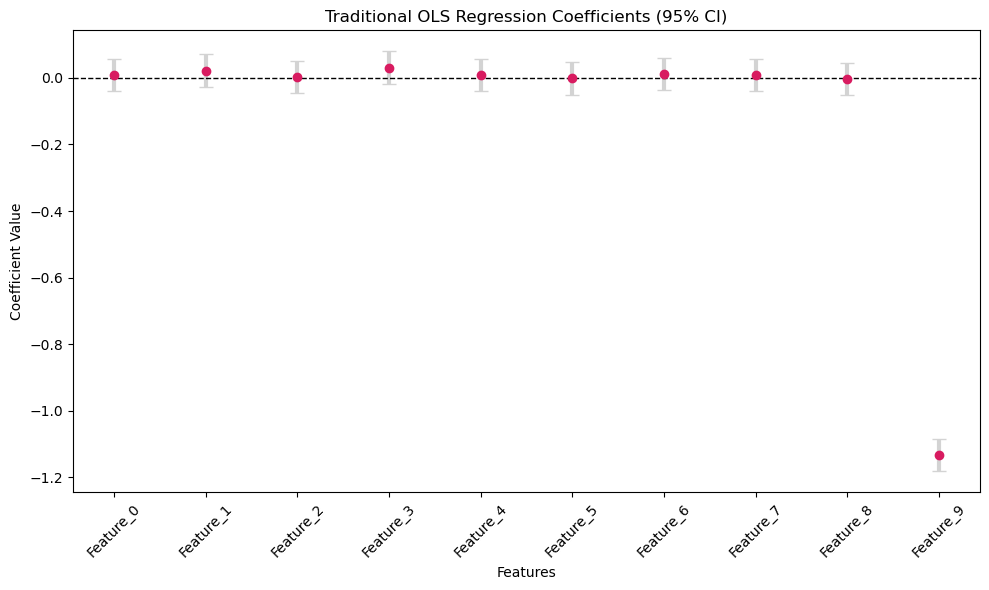

OLS Significant Features: {'Feature_9': {'pvalue': 0.0, 'coefficient': -1.1337902094410521}}


In [35]:

# 2. Traditional Baseline (OLS)
ols_model, significant_features = perform_traditional_regression(X_train, y_train)

print("OLS Significant Features:", significant_features)


#### test Traditional Baseline (OLS) results

In [36]:

print("Testing Traditional Baseline (OLS):")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

# print("Testing String Input:")
# metrics2 = evaluate_feature_discovery(list(significant_features.keys()), true_linear_weights, true_interaction_weights)

# metrics

Testing Traditional Baseline (OLS):

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 2
  ├─ Purely Linear / Main:     1
  └─ Involved in Interactions: 1
Total Model Features Found:    1
--------------------------------------------------
True Positives (Correct): 1 -> ['Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Missed): 1 -> ['Feature_3']
--------------------------------------------------
Precision:            1.0000
Overall Recall:       0.5000
  ├─ Linear Recall:   1.0000  (Found 1/1)
  └─ Interact Recall: 0.0000  (Found 0/1)
F1-Score:             0.6667



### make a simple xgboost model for test 3

In [37]:

# 3. Machine Learning Modeling (XGBoost)
# We pass the pre-split data directly to ensure apples-to-apples comparison
model = xgb.XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1,base_score=np.mean(y_train))
model.fit(X_train, y_train)

# Evaluate the XGBoost Model on the test set
evaluate_xgb_model(model, X_test, y_test)



--- XGBoost Performance (Testing) ---
R-squared Score:                0.3415
Mean Squared Error (MSE):       0.8668
Root Mean Squared Error (RMSE): 0.9310
Mean Absolute Error (MAE):      0.6885
-------------------------------------



### look at XGBoost Native Importances

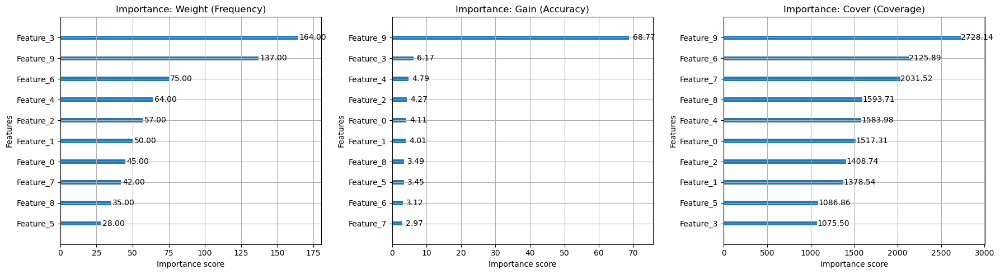

XGBoost Weight Importance: {'Feature_0': 45.0, 'Feature_1': 50.0, 'Feature_2': 57.0, 'Feature_3': 164.0, 'Feature_4': 64.0, 'Feature_5': 28.0, 'Feature_6': 75.0, 'Feature_7': 42.0, 'Feature_8': 35.0, 'Feature_9': 137.0}
XGBoost Gain Importance: {'Feature_0': 4.1106719970703125, 'Feature_1': 4.006287574768066, 'Feature_2': 4.27223539352417, 'Feature_3': 6.173591613769531, 'Feature_4': 4.787628650665283, 'Feature_5': 3.446687936782837, 'Feature_6': 3.124376058578491, 'Feature_7': 2.971585512161255, 'Feature_8': 3.487255096435547, 'Feature_9': 68.7718734741211}
XGBoost Cover Importance: {'Feature_0': 1517.3111572265625, 'Feature_1': 1378.5400390625, 'Feature_2': 1408.73681640625, 'Feature_3': 1075.5, 'Feature_4': 1583.984375, 'Feature_5': 1086.857177734375, 'Feature_6': 2125.893310546875, 'Feature_7': 2031.5238037109375, 'Feature_8': 1593.7142333984375, 'Feature_9': 2728.138671875}


In [38]:

# 4. XGBoost Native Importances
weight_importance, gain_importance, cover_importance = plot_all_xgb_importances(model)

print("XGBoost Weight Importance:", weight_importance)
print("XGBoost Gain Importance:", gain_importance)
print("XGBoost Cover Importance:", cover_importance)


#### test XGBoost Native Importances results

In [39]:

C = -0.0 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = weight_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing weight_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = gain_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing gain_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = cover_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing cover_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing weight_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 2
  ├─ Purely Linear / Main:     1
  └─ Involved in Interactions: 1
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 2 -> ['Feature_9', 'Feature_3']
False Positives (Noise):  1 -> ['Feature_6']
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            0.6667
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 1/1)
  └─ Interact Recall: 1.0000  (Found 1/1)
F1-Score:             0.8000
Rank Correlation:     1.0000 (p-val: nan)

Testing gain_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 2
  ├─ Purely Linear / Main:     1
  └─ Involved in Interactions: 1
Total Model Features Found:    1
--------------------------------------------------
True Positives (Correct): 1 -> ['Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Mi

### try to use SHAP to find the influencing inputs

In [40]:

# 5. Explainability (SHAP)
shap_values = compute_shap_values(model, X_train, X_test)


#### individual SHAP features ranking

Plotting SHAP analysis for top 5 features: ['Feature_9', 'Feature_3', 'Feature_6', 'Feature_4', 'Feature_0']


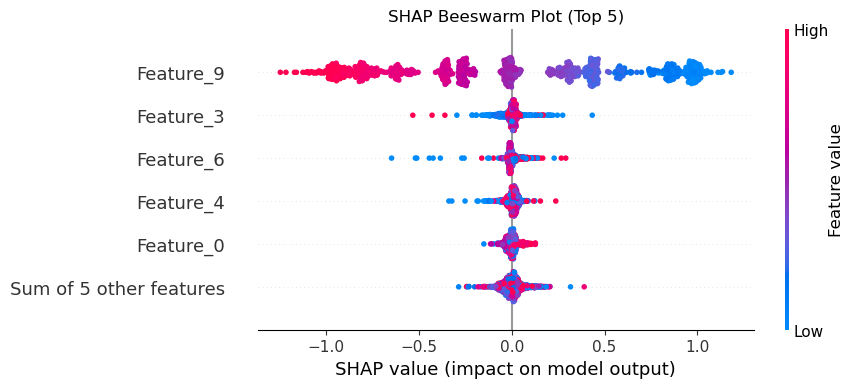

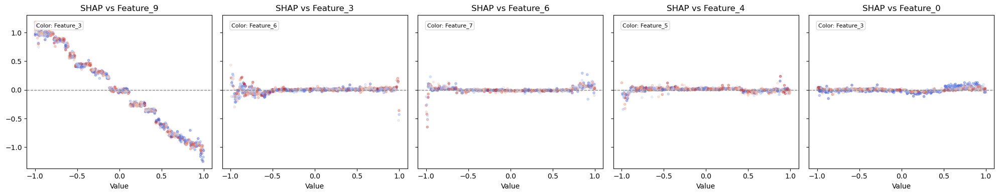

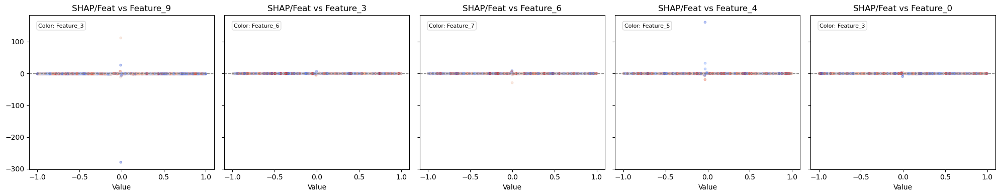

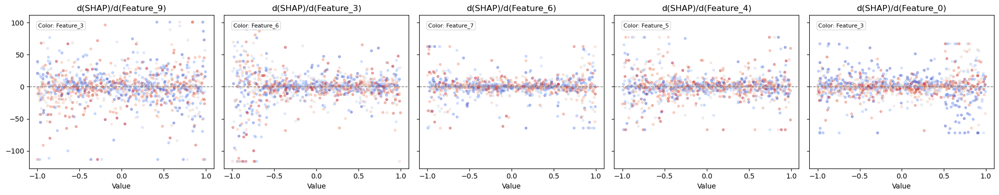

In [41]:

# 6. Visualization (SHAP)
plot_shap_analysis(shap_values, feature_names)


#### try to look for feature interactions
we should see some now


--- Computing SHAP Interaction Values ---


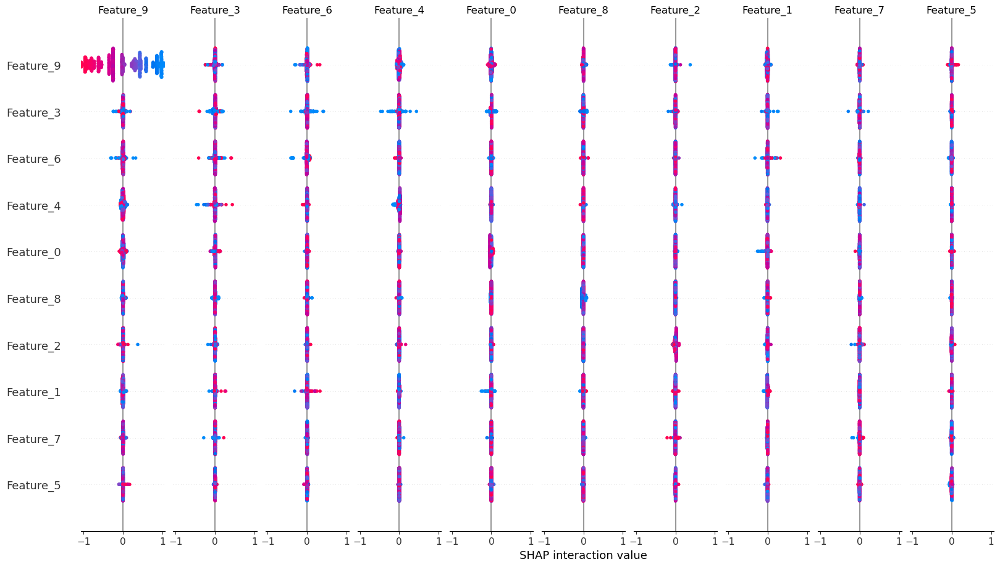


Strongest Interaction found by SHAP: Feature_4 & Feature_9
Plotting pure interaction effect for Feature_4 and Feature_9...


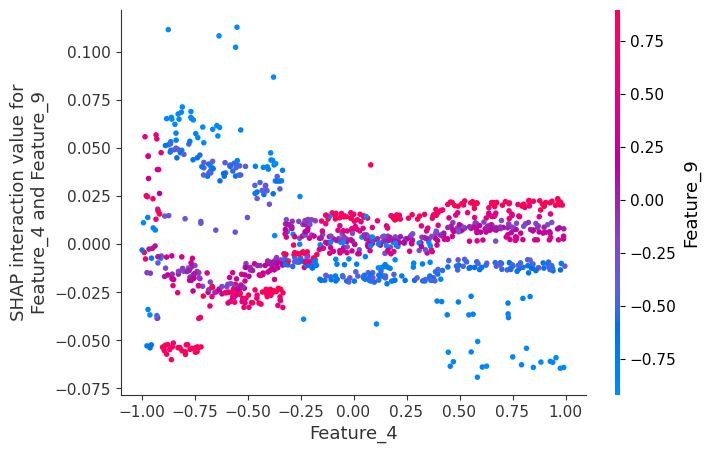


--- SHAP Interaction Feature Importance Ranking ---
Top 10 Strongest Interactions:
  Feature_4 * Feature_9: 0.0189
  Feature_0 * Feature_3: 0.0169
  Feature_0 * Feature_9: 0.0152
  Feature_3 * Feature_4: 0.0142
  Feature_3 * Feature_9: 0.0136
  Feature_6 * Feature_9: 0.0122
  Feature_3 * Feature_6: 0.0118
  Feature_1 * Feature_9: 0.0115
  Feature_8 * Feature_9: 0.0085
  Feature_3 * Feature_8: 0.0085
-------------------------------------------------

SHAP Interaction Values: {'Feature_4 * Feature_9': 0.018866078928112984, 'Feature_0 * Feature_3': 0.016882892698049545, 'Feature_0 * Feature_9': 0.015249711461365223, 'Feature_3 * Feature_4': 0.01416919194161892, 'Feature_3 * Feature_9': 0.013569625094532967, 'Feature_6 * Feature_9': 0.012216584756970406, 'Feature_3 * Feature_6': 0.01184826623648405, 'Feature_1 * Feature_9': 0.011487175710499287, 'Feature_8 * Feature_9': 0.008547462522983551, 'Feature_3 * Feature_8': 0.008482868783175945, 'Feature_2 * Feature_3': 0.007237688172608614, 'Fea

In [42]:

# 7. Deep Dive: SHAP Interaction Analysis
# Note: X_test must be a DataFrame or numpy array. We use X_test directly.
shap_interaction_values = analyze_shap_interactions(model, X_test, feature_names)

print("SHAP Interaction Values:", shap_interaction_values)


#### SHAP summry

In [43]:

# 8. Summary (SHAP)
ranked_features = print_feature_importance(shap_values)

print("Ranked Features by SHAP Importance:", ranked_features)



--- SHAP Feature Importance Ranking ---
SHAP Global Importance Dictionary:
  Feature_9: 0.5700
  Feature_3: 0.0293
  Feature_6: 0.0245
  Feature_4: 0.0230
  Feature_0: 0.0208
  Feature_8: 0.0164
  Feature_2: 0.0161
  Feature_1: 0.0150
  Feature_7: 0.0100
  Feature_5: 0.0082

Ranked Features (Most to Least Important):
['Feature_9', 'Feature_3', 'Feature_6', 'Feature_4', 'Feature_0', 'Feature_8', 'Feature_2', 'Feature_1', 'Feature_7', 'Feature_5']
---------------------------------------

Ranked Features by SHAP Importance: {'Feature_9': 0.57002956, 'Feature_3': 0.029346354, 'Feature_6': 0.024478186, 'Feature_4': 0.02299208, 'Feature_0': 0.0208026, 'Feature_8': 0.016412111, 'Feature_2': 0.016077884, 'Feature_1': 0.015022681, 'Feature_7': 0.010015501, 'Feature_5': 0.008183799}


#### test SHAP Importances results

In [44]:
C = -0.5 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = ranked_features
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 2
  ├─ Purely Linear / Main:     1
  └─ Involved in Interactions: 1
Total Model Features Found:    10
--------------------------------------------------
True Positives (Correct): 2 -> ['Feature_9', 'Feature_3']
False Positives (Noise):  8 -> ['Feature_7', 'Feature_1', 'Feature_4', 'Feature_8', 'Feature_5', 'Feature_0', 'Feature_2', 'Feature_6']
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            0.2000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 1/1)
  └─ Interact Recall: 1.0000  (Found 1/1)
F1-Score:             0.3333
Rank Correlation:     -1.0000 (p-val: nan)



### SHAP STATISTICAL VALIDATION

#### Permutation Test

In [45]:
shap_pvalues = compute_shap_pvalues(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    true_shap_values=shap_values, 
    feature_names=feature_names, 
    n_permutations=50 # Increase to 100 or 500 for more robust (but slower) results
)

print("SHAP Feature P-values:", shap_pvalues)



--- Calculating Empirical SHAP p-values (Permutations: 50) ---

SHAP Empirical P-values (< 0.05 is statistically significant):
  - Feature_9: 0.0196 *
  - Feature_3: 0.5098 
  - Feature_6: 0.6078 
  - Feature_4: 0.7843 
  - Feature_0: 0.8039 
  - Feature_2: 0.9216 
  - Feature_1: 0.9608 
  - Feature_8: 0.9804 
  - Feature_5: 1.0000 
  - Feature_7: 1.0000 
----------------------------------------------------

SHAP Feature P-values: {'Feature_9': 0.0196078431372549, 'Feature_3': 0.5098039215686274, 'Feature_6': 0.6078431372549019, 'Feature_4': 0.7843137254901961, 'Feature_0': 0.803921568627451, 'Feature_2': 0.9215686274509803, 'Feature_1': 0.9607843137254902, 'Feature_8': 0.9803921568627451, 'Feature_5': 1.0, 'Feature_7': 1.0}


In [46]:

p_threshold = 0.05 # Adjust this threshold to be more or less strict in filtering features based on p-values

significant_features = ranked_features
# get only values where p-value < p_threshold (e.g., 0.05)
significant_features = {k: v for k, v in significant_features.items() if shap_pvalues.get(k, 1.0) < p_threshold}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)


Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 2
  ├─ Purely Linear / Main:     1
  └─ Involved in Interactions: 1
Total Model Features Found:    1
--------------------------------------------------
True Positives (Correct): 1 -> ['Feature_9']
False Positives (Noise):  0 -> []
False Negatives (Missed): 1 -> ['Feature_3']
--------------------------------------------------
Precision:            1.0000
Overall Recall:       0.5000
  ├─ Linear Recall:   1.0000  (Found 1/1)
  └─ Interact Recall: 0.0000  (Found 0/1)
F1-Score:             0.6667



#### Boruta Method

In [47]:
shadow_results = compute_shap_shadow_features(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    feature_names=feature_names
)

print("SHAP Shadow Feature Results:", shadow_results)



--- Running SHAP Shadow Feature Analysis ---
Maximum Shadow Feature Importance (Noise Threshold): 0.0229

Shadow Feature Significance Results:
  - Feature_0: 0.0131 -> FAILED (Noise)
  - Feature_1: 0.0079 -> FAILED (Noise)
  - Feature_2: 0.0115 -> FAILED (Noise)
  - Feature_3: 0.0282 -> PASSED (Significant)
  - Feature_4: 0.0133 -> FAILED (Noise)
  - Feature_5: 0.0048 -> FAILED (Noise)
  - Feature_6: 0.0174 -> FAILED (Noise)
  - Feature_7: 0.0049 -> FAILED (Noise)
  - Feature_8: 0.0132 -> FAILED (Noise)
  - Feature_9: 0.5666 -> PASSED (Significant)
----------------------------------------------

SHAP Shadow Feature Results: {'Feature_0': False, 'Feature_1': False, 'Feature_2': False, 'Feature_3': True, 'Feature_4': False, 'Feature_5': False, 'Feature_6': False, 'Feature_7': False, 'Feature_8': False, 'Feature_9': True}


In [48]:

significant_features = ranked_features
# get only values where shadow_results indicate significance (e.g., shadow_results[f] == True)
significant_features = {k: v for k, v in significant_features.items() if shadow_results.get(k, False)}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 2
  ├─ Purely Linear / Main:     1
  └─ Involved in Interactions: 1
Total Model Features Found:    2
--------------------------------------------------
True Positives (Correct): 2 -> ['Feature_9', 'Feature_3']
False Positives (Noise):  0 -> []
False Negatives (Missed): 0 -> []
--------------------------------------------------
Precision:            1.0000
Overall Recall:       1.0000
  ├─ Linear Recall:   1.0000  (Found 1/1)
  └─ Interact Recall: 1.0000  (Found 1/1)
F1-Score:             1.0000
Rank Correlation:     -1.0000 (p-val: nan)



#### Confidence Intervals

In [49]:
bootstrap_results = compute_shap_bootstrapping(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    feature_names=feature_names,
    n_bootstraps=30 # Adjust based on how long you want to wait
)

print("SHAP Bootstrapping Results:", bootstrap_results)



--- Running SHAP Bootstrapping Analysis (Iterations: 30) ---

SHAP Bootstrapped 95% Confidence Intervals:
  - Feature_9: 0.5725 (95% CI: [0.5477, 0.5987])
  - Feature_3: 0.0465 (95% CI: [0.0296, 0.0610])
  - Feature_0: 0.0286 (95% CI: [0.0156, 0.0476])
  - Feature_4: 0.0272 (95% CI: [0.0121, 0.0504])
  - Feature_1: 0.0269 (95% CI: [0.0151, 0.0500])
  - Feature_6: 0.0263 (95% CI: [0.0155, 0.0399])
  - Feature_8: 0.0262 (95% CI: [0.0161, 0.0361])
  - Feature_2: 0.0248 (95% CI: [0.0123, 0.0438])
  - Feature_5: 0.0203 (95% CI: [0.0089, 0.0362])
  - Feature_7: 0.0194 (95% CI: [0.0103, 0.0282])
-------------------------------------------------------

SHAP Bootstrapping Results: {'Feature_9': (0.5724659701188405, 0.5476790189743042, 0.5987375363707542), 'Feature_3': (0.04654092950125535, 0.029602340050041677, 0.06100215530022979), 'Feature_0': (0.028570770161847274, 0.0156317594461143, 0.04759098552167415), 'Feature_4': (0.027245818357914686, 0.01206834155600518, 0.0503642632625997), 'Featur

## test with hard world conditions

### make example data 4

In [50]:

# 1. Setup & Data
X, hidden_features, y, feature_names, hidden_feature_names, true_linear_weights, true_interaction_weights = generate_synthetic_data_with_hidden_features(
    num_inputs = 3000, 
    num_samples = 50000, 
    num_contributing_features = (5, 15), 
    num_hidden_features = (100, 200), 
    input_range = (-10.0, 10.0),
    weight_range = (-7, 7), 
    num_interactions = (10, 20), 
    interaction_weight_range = (-5, 5), 
    noise_std = 0.05, 
    hidden_in_linear = True,           # Should hidden features have a linear impact?
    hidden_in_interactions = True,     # Should hidden features be part of interactions?
    missing_pct = 0.1,                 # 10% of the data will be missing (NaN)
    error_pct = 0.1,                   # 10% of the data will be corrupted
    )

# Split data here so both OLS and XGBoost train on the exact same subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


--- Generative Model Info (With HIDDEN Features) ---
Total linear variables:  5 (3 visible, 2 hidden)
Total interaction terms: 10 (8 pure visible, 2 involving hidden)

--- True Mathematical Equation ---
y = (5.7111 * Feature_418) + (5.3822 * Hidden_156) + (4.9877 * Feature_818) + (4.2456 * Feature_1683) + (1.2478 * Hidden_67) + (4.4882 * Feature_312 * Feature_2623) + (3.7556 * Feature_2836 * Hidden_153) + (3.2729 * Feature_2102 * Feature_2586) + (-2.9717 * Feature_2323 * Feature_2556) + (2.9243 * Feature_1043 * Feature_1320) + (-2.5916 * Feature_1095 * Feature_1624) + (-1.8443 * Feature_2770 * Hidden_98) + (-1.5208 * Feature_674 * Feature_2477) + (0.6583 * Feature_654 * Feature_1469) + (-0.1280 * Feature_586 * Feature_2730) + Noise(0, 0.05)
----------------------------------------------------



### make the Traditional Baseline (OLS)


--- Traditional OLS Regression (NaN Strategy: impute_mean) ---
Bonferroni correction applied: Adjusted p-value threshold = 1.6667e-05
Imputed missing values with column means.
                            OLS Regression Results                            
Dep. Variable:            Feature_818   R-squared:                       0.096
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     1.305
Date:                Sun, 24 May 2026   Prob (F-statistic):           3.58e-25
Time:                        14:57:17   Log-Likelihood:            -2.8227e+05
No. Observations:               40000   AIC:                         5.705e+05
Df Residuals:                   36999   BIC:                         5.963e+05
Df Model:                        3000                                         
Covariance Type:            nonrobust                                         
                   coef    std er

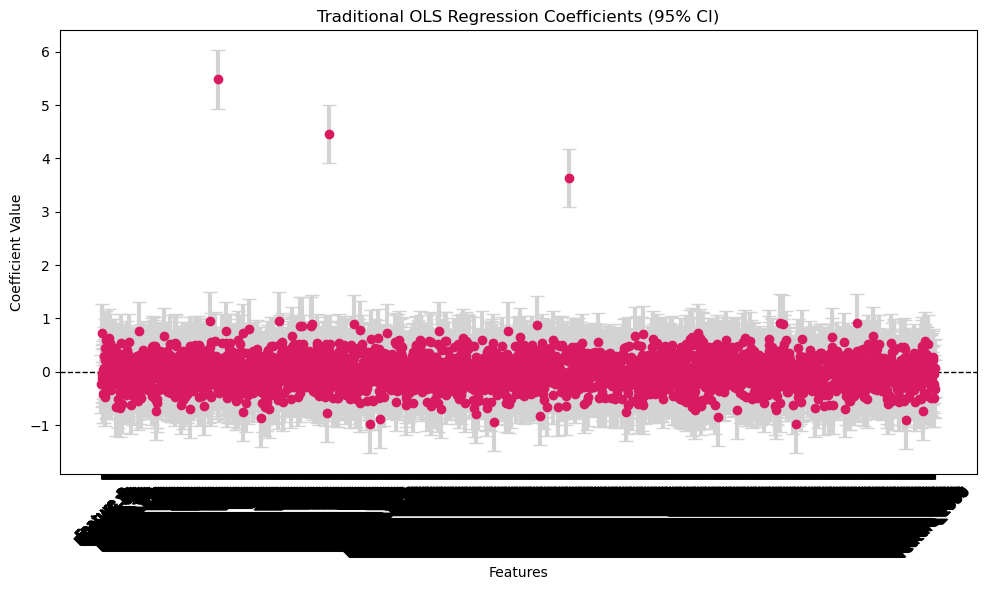

OLS Significant Features: {'Feature_418': {'pvalue': 2.3254361382817084e-86, 'coefficient': 5.480721434333267}, 'Feature_818': {'pvalue': 4.063378834098867e-58, 'coefficient': 4.464477023638981}, 'Feature_1683': {'pvalue': 2.278504292479528e-39, 'coefficient': 3.640223333160143}}
Execution time: 127.90794610977173 seconds


In [51]:

# 2. Traditional Baseline (OLS)
start_time = time.time()
ols_model, significant_features = perform_traditional_regression(X_train, y_train)
end_time = time.time()

print("OLS Significant Features:", significant_features)
print(f"Execution time: {end_time - start_time} seconds")


#### test Traditional Baseline (OLS) results

In [52]:

print("Testing Traditional Baseline (OLS):")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

# print("Testing String Input:")
# metrics2 = evaluate_feature_discovery(list(significant_features.keys()), true_linear_weights, true_interaction_weights)

# metrics

Testing Traditional Baseline (OLS):

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 21
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 18
Total Model Features Found:    3
--------------------------------------------------
True Positives (Correct): 3 -> ['Feature_1683', 'Feature_818', 'Feature_418']
False Positives (Noise):  0 -> []
False Negatives (Missed): 18 -> ['Feature_654', 'Feature_2586', 'Feature_2836', 'Feature_674', 'Feature_2730', 'Feature_1624', 'Feature_1320', 'Feature_312', 'Feature_586', 'Feature_2323', 'Feature_1095', 'Feature_1469', 'Feature_2770', 'Feature_1043', 'Feature_2556', 'Feature_2477', 'Feature_2623', 'Feature_2102']
--------------------------------------------------
Precision:            1.0000
Overall Recall:       0.1429
  ├─ Linear Recall:   1.0000  (Found 3/3)
  └─ Interact Recall: 0.0000  (Found 0/18)
F1-Score:             0.2500
Rank Correlation:     -1.0000 (p-val: 0.0000)



### make a simple xgboost model for test 4

In [53]:

# 3. Machine Learning Modeling (XGBoost)
# We pass the pre-split data directly to ensure apples-to-apples comparison
start_time = time.time()
model = xgb.XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, base_score=np.mean(y_train), missing=np.nan, n_jobs=-1)
model.fit(X_train, y_train)

# Evaluate the XGBoost Model on the test set
evaluate_xgb_model(model, X_test, y_test)
end_time = time.time()
print(f"Execution time: {end_time - start_time} seconds")



--- XGBoost Performance (Testing) ---
R-squared Score:                0.0197
Mean Squared Error (MSE):       85089.0619
Root Mean Squared Error (RMSE): 291.7003
Mean Absolute Error (MAE):      232.0096
-------------------------------------

Execution time: 160.1276149749756 seconds


In [54]:
X_train

,Feature_0,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,...,Feature_2990,Feature_2991,Feature_2992,Feature_2993,Feature_2994,Feature_2995,Feature_2996,Feature_2997,Feature_2998,Feature_2999
39087,-8.175564,1.430039,-9.013223,-8.590085,NaN,8.864835,0.343536,3.682921,-6.441503,-9.046977,...,3.942074,1.046501,-8.077341,NaN,9.580042,3.450764,NaN,6.178993,-0.464995,5.077038
30893,NaN,-8.217522,-0.428226,-8.357990,1.630977,-1.679815,8.822335,-0.426053,-4.369924,-7.123165,...,-6.425396,NaN,-6.560187,0.144781,-5.478204,3.758847,2.647298,-8.799443,3.048827,3.705348
45278,-2.102365,7.193605,-8.093949,5.166414,NaN,-9.863832,-4.578828,0.975455,3.754489,8.241652,...,-6.460377,3.468056,7.288333,NaN,5.018007,3.017813,-9.587440,-9.163858,-3.471752,8.978154
16398,8.963960,6.703069,8.856646,7.162613,1.328542,7.700199,-3.344932,NaN,7.355236,2.834981,...,8.286117,-8.028723,4.963935,-1.607737,0.533139,3.996177,NaN,5.683406,-4.103983,1.909284
13653,-8.801897,1.957427,0.368108,-7.706488,-9.693473,1.335103,6.062738,-0.368675,2.581679,-6.628841,...,4.481586,-6.583605,-9.164940,-1.963333,-7.534836,-4.582910,1.271848,-9.824015,-3.364359,-7.526541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,9.129046,-5.618861,-3.882716,-1.091385,-6.140412,7.832285,-3.641310,-5.571210,6.255615,9.157641,...,NaN,-0.021272,4.284382,4.248574,-4.813753,-5.297846,1.544547,-6.963705,-9.626617,0.561914
44732,0.862272,-5.722918,2.921826,5.550755,-4.033379,5.224377,0.180536,-1.992218,-7.769355,-0.928361,...,-6.913414,7.711254,5.673555,6.448666,NaN,5.393716,-7.925131,-9.674823,-3.753007,6.873472
38158,-5.651399,3.133313,-4.636487,-6.179620,7.347049,5.834581,-2.142865,-2.784459,1.154683,6.877541,...,3.842506,-7.960550,-5.281157,-9.434954,1.186050,-5.807534,-4.907408,NaN,2.951603,-6.095208
860,-2.963386,-2.055056,-8.366680,2.916497,9.833640,6.307543,2.321247,4.906150,NaN,-9.533597,...,-1.760373,-8.805490,-2.019222,0.852181,-1.186347,-1.669689,-8.214147,0.060732,NaN,-3.225536


In [55]:

# 3. Machine Learning Modeling (XGBoost)
# We pass the pre-split data directly to ensure apples-to-apples comparison
start_time = time.time()
big_model = xgb.XGBRegressor(n_estimators=200, max_depth=5, learning_rate=0.1, base_score=np.mean(y_train), missing=np.nan, n_jobs=-1)
big_model.fit(X_train, y_train)

# Evaluate the XGBoost Model on the test set
evaluate_xgb_model(big_model, X_test, y_test)
end_time = time.time()
print(f"Execution time: {end_time - start_time} seconds")



--- XGBoost Performance (Testing) ---
R-squared Score:                0.0197
Mean Squared Error (MSE):       85097.1005
Root Mean Squared Error (RMSE): 291.7141
Mean Absolute Error (MAE):      232.1813
-------------------------------------

Execution time: 390.03287053108215 seconds


### look at XGBoost Native Importances

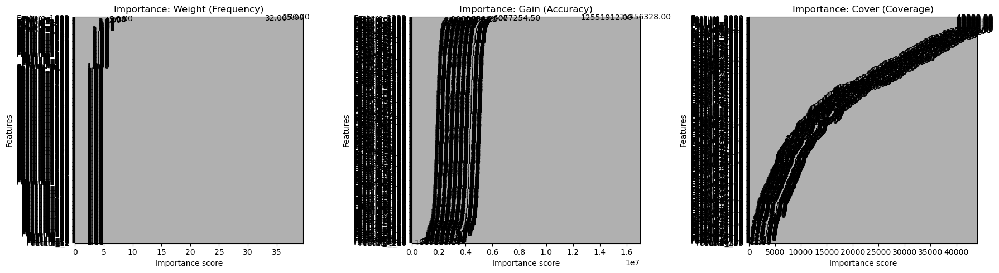

XGBoost Weight Importance: {'Feature_2': 1.0, 'Feature_11': 1.0, 'Feature_12': 1.0, 'Feature_13': 1.0, 'Feature_17': 1.0, 'Feature_18': 1.0, 'Feature_19': 1.0, 'Feature_26': 1.0, 'Feature_29': 1.0, 'Feature_35': 1.0, 'Feature_37': 1.0, 'Feature_47': 1.0, 'Feature_49': 1.0, 'Feature_53': 2.0, 'Feature_59': 1.0, 'Feature_61': 1.0, 'Feature_64': 1.0, 'Feature_66': 2.0, 'Feature_73': 2.0, 'Feature_74': 1.0, 'Feature_77': 1.0, 'Feature_86': 1.0, 'Feature_105': 1.0, 'Feature_109': 1.0, 'Feature_115': 1.0, 'Feature_134': 1.0, 'Feature_137': 1.0, 'Feature_138': 1.0, 'Feature_143': 1.0, 'Feature_160': 1.0, 'Feature_171': 1.0, 'Feature_191': 1.0, 'Feature_197': 2.0, 'Feature_198': 1.0, 'Feature_201': 1.0, 'Feature_207': 2.0, 'Feature_209': 1.0, 'Feature_219': 1.0, 'Feature_222': 1.0, 'Feature_224': 2.0, 'Feature_230': 1.0, 'Feature_236': 1.0, 'Feature_245': 1.0, 'Feature_246': 1.0, 'Feature_252': 1.0, 'Feature_269': 1.0, 'Feature_272': 1.0, 'Feature_276': 1.0, 'Feature_284': 1.0, 'Feature_307': 

In [56]:

# 4. XGBoost Native Importances
weight_importance, gain_importance, cover_importance = plot_all_xgb_importances(model)

print("XGBoost Weight Importance:", weight_importance)
print("XGBoost Gain Importance:", gain_importance)
print("XGBoost Cover Importance:", cover_importance)


#### test XGBoost Native Importances results

In [57]:

C = 0.0 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = weight_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing weight_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = gain_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing gain_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = cover_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing cover_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing weight_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 21
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 18
Total Model Features Found:    102
--------------------------------------------------
True Positives (Correct): 6 -> ['Feature_2323', 'Feature_1683', 'Feature_818', 'Feature_418', 'Feature_1624', 'Feature_2556']
False Positives (Noise):  96 -> ['Feature_754', 'Feature_2499', 'Feature_1236', 'Feature_2451', 'Feature_986', 'Feature_1297', 'Feature_1185', 'Feature_1505', 'Feature_999', 'Feature_1910', 'Feature_2495', 'Feature_638', 'Feature_335', 'Feature_1023', 'Feature_1567', 'Feature_2628', 'Feature_1986', 'Feature_1755', 'Feature_1408', 'Feature_2896', 'Feature_2521', 'Feature_2234', 'Feature_1055', 'Feature_909', 'Feature_1950', 'Feature_2486', 'Feature_1258', 'Feature_2632', 'Feature_628', 'Feature_1359', 'Feature_852', 'Feature_1748', 'Feature_743', 'Feature_2517', 'Feature_416', 'Feature_1491', 'Feature_2147', 'Fea

### try to use SHAP to find the influencing inputs

In [58]:

# 5. Explainability (SHAP)
start_time = time.time()
shap_values = compute_shap_values(model, X_train, X_test)
end_time = time.time()
print(f"Execution time: {end_time - start_time} seconds")


Execution time: 1.6191725730895996 seconds


#### individual SHAP features ranking

Plotting SHAP analysis for top 5 features: ['Feature_418', 'Feature_818', 'Feature_1683', 'Feature_1412', 'Feature_967']


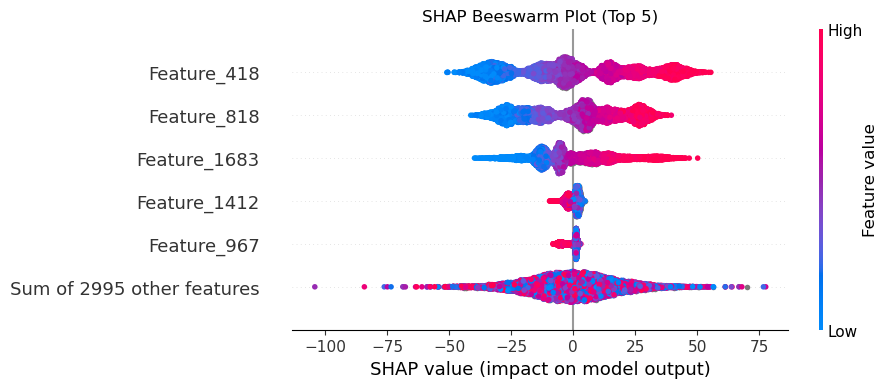

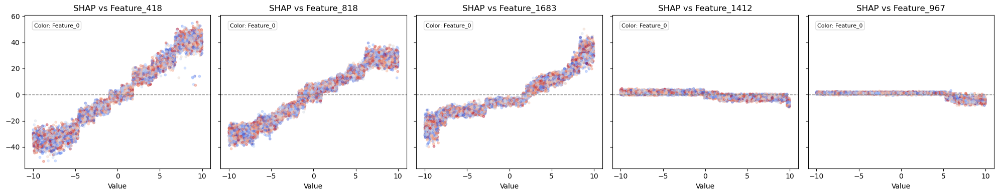

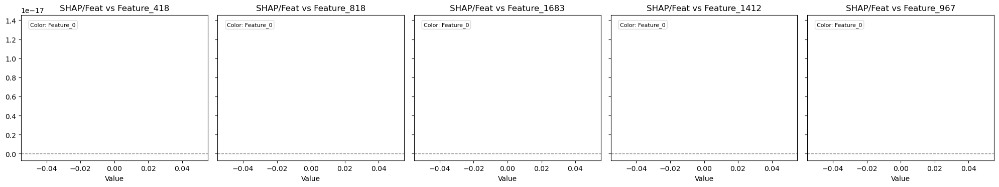

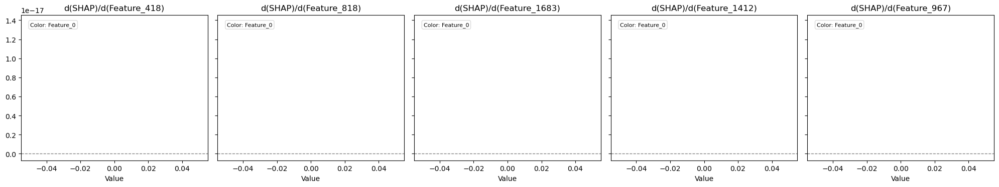

In [59]:

# 6. Visualization (SHAP)
plot_shap_analysis(shap_values, feature_names)


#### try to look for feature interactions
we should see some now

In [60]:

# 7. Deep Dive: SHAP Interaction Analysis
# Note: X_test must be a DataFrame or numpy array. We use X_test directly.
start_time = time.time()
# shap_interaction_values = analyze_shap_interactions(model, X_test, feature_names)
# shap_interaction_values = analyze_shap_interactions_memory_efficient(model, X_test, feature_names, max_samples=2000, batch_size=50)
shap_interaction_values = analyze_shap_interactions_with_early_stop(model, X_test, feature_names, max_samples=1000, batch_size=50, limit=1e-4, plimit=0.01, min_batches=5)
end_time = time.time()

print("SHAP Interaction Values:", shap_interaction_values)
print(f"Execution time: {end_time - start_time} seconds")



--- Computing SHAP Interactions (Early Stopping @ limit=0.0001, plimit=0.01) ---
Batch 1: Initializing baseline...
Batch 2: Max Change = 1.763080
Batch 2: Max % Change = 900.9721%
Batch 3: Max Change = 0.569370
Batch 3: Max % Change = 308.0678%
Batch 4: Max Change = 1.140544
Batch 4: Max % Change = 281.9194%
Batch 5: Max Change = 0.263447
Batch 5: Max % Change = 163.2460%
Batch 6: Max Change = 0.242012
Batch 6: Max % Change = 228.5229%
Batch 7: Max Change = 0.150889
Batch 7: Max % Change = 151.2217%
Batch 8: Max Change = 0.382364
Batch 8: Max % Change = 156.5639%
Batch 9: Max Change = 0.194274
Batch 9: Max % Change = 43.2973%
Batch 10: Max Change = 0.189690
Batch 10: Max % Change = 93.9225%
Batch 11: Max Change = 0.070888
Batch 11: Max % Change = 69.4789%
Batch 12: Max Change = 0.167737
Batch 12: Max % Change = 75.2122%
Batch 13: Max Change = 0.169371
Batch 13: Max % Change = 77.0770%
Batch 14: Max Change = 0.120036
Batch 14: Max % Change = 650.5843%
Batch 15: Max Change = 0.184358
Ba

#### SHAP summry

In [61]:

# 8. Summary (SHAP)
ranked_features = print_feature_importance(shap_values)

print("Ranked Features by SHAP Importance:", ranked_features)



--- SHAP Feature Importance Ranking ---
SHAP Global Importance Dictionary:
  Feature_418: 20.6427
  Feature_818: 16.4754
  Feature_1683: 12.4126
  Feature_1412: 1.8990
  Feature_967: 1.6893
  Feature_511: 1.6225
  Feature_2451: 1.5908
  Feature_716: 1.5869
  Feature_910: 1.4033
  Feature_1567: 1.3375
  Feature_931: 1.3341
  Feature_1986: 1.2679
  Feature_389: 1.1900
  Feature_1297: 1.1628
  Feature_1002: 1.1504
  Feature_207: 1.1349
  Feature_754: 1.1184
  Feature_2033: 1.1156
  Feature_66: 1.0878
  Feature_2486: 1.0837
  Feature_2599: 1.0743
  Feature_2499: 1.0238
  Feature_2556: 1.0155
  Feature_1910: 0.9860
  Feature_1145: 0.9833
  Feature_2632: 0.9828
  Feature_1408: 0.9683
  Feature_2718: 0.9357
  Feature_1302: 0.9114
  Feature_638: 0.8846
  Feature_2125: 0.8784
  Feature_1258: 0.8462
  Feature_2673: 0.8340
  Feature_885: 0.8216
  Feature_2915: 0.7936
  Feature_1950: 0.7934
  Feature_2323: 0.7834
  Feature_850: 0.7576
  Feature_197: 0.7569
  Feature_2628: 0.7567
  Feature_1055: 0

#### test SHAP Importances results

In [62]:
C = 0.0 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = ranked_features
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 21
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 18
Total Model Features Found:    403
--------------------------------------------------
True Positives (Correct): 8 -> ['Feature_2323', 'Feature_1683', 'Feature_818', 'Feature_654', 'Feature_1095', 'Feature_418', 'Feature_1624', 'Feature_2556']
False Positives (Noise):  395 -> ['Feature_2032', 'Feature_1880', 'Feature_2969', 'Feature_2560', 'Feature_1236', 'Feature_19', 'Feature_1297', 'Feature_585', 'Feature_2027', 'Feature_1018', 'Feature_387', 'Feature_1185', 'Feature_696', 'Feature_2938', 'Feature_1051', 'Feature_873', 'Feature_1567', 'Feature_861', 'Feature_604', 'Feature_35', 'Feature_272', 'Feature_874', 'Feature_1801', 'Feature_1024', 'Feature_1816', 'Feature_1434', 'Feature_602', 'Feature_2927', 'Feature_2234', 'Feature_653', 'Feature_1850', 'Feature_1664', 'Feature_1963', 'Feature_2486', 'Feature_2705', 'Feature_2

### SHAP STATISTICAL VALIDATION

#### Permutation Test

In [63]:

# start_time = time.time()
# shap_pvalues = compute_shap_pvalues(
#     model=model,
#     X_train=X_train, 
#     y_train=y_train, 
#     X_test=X_test, 
#     true_shap_values=shap_values, 
#     feature_names=feature_names, 
#     n_permutations=50 # Increase to 100 or 500 for more robust (but slower) results
# )
# end_time = time.time()

# print("SHAP Feature P-values:", shap_pvalues)
# print(f"Execution time: {end_time - start_time} seconds")


In [64]:

# p_threshold = 0.05 # Adjust this threshold to be more or less strict in filtering features based on p-values

# significant_features = ranked_features
# # get only values where p-value < p_threshold (e.g., 0.05)
# significant_features = {k: v for k, v in significant_features.items() if shap_pvalues.get(k, 1.0) < p_threshold}
# significant_features 

# print("Testing SHAP importance:")
# metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)


#### Boruta Method

In [65]:


start_time = time.time()
shadow_results = compute_shap_shadow_features(
    model=model,
    X_train=X_train, 
    y_train=y_train, 
    X_test=X_test, 
    feature_names=feature_names
)
end_time = time.time()

print("SHAP Shadow Feature Results:", shadow_results)
print(f"Execution time: {end_time - start_time} seconds")



--- Running SHAP Shadow Feature Analysis ---


Maximum Shadow Feature Importance (Noise Threshold): 1.3364

Shadow Feature Significance Results:
  - Feature_0: 0.0000 -> FAILED (Noise)
  - Feature_1: 0.0000 -> FAILED (Noise)
  - Feature_2: 0.0000 -> FAILED (Noise)
  - Feature_3: 0.0000 -> FAILED (Noise)
  - Feature_4: 0.0000 -> FAILED (Noise)
  - Feature_5: 0.0000 -> FAILED (Noise)
  - Feature_6: 0.0000 -> FAILED (Noise)
  - Feature_7: 0.0000 -> FAILED (Noise)
  - Feature_8: 0.0000 -> FAILED (Noise)
  - Feature_9: 0.0000 -> FAILED (Noise)
  - Feature_10: 0.0000 -> FAILED (Noise)
  - Feature_11: 0.4290 -> FAILED (Noise)
  - Feature_12: 0.0000 -> FAILED (Noise)
  - Feature_13: 0.0000 -> FAILED (Noise)
  - Feature_14: 0.0000 -> FAILED (Noise)
  - Feature_15: 0.0000 -> FAILED (Noise)
  - Feature_16: 0.0000 -> FAILED (Noise)
  - Feature_17: 0.0000 -> FAILED (Noise)
  - Feature_18: 0.0000 -> FAILED (Noise)
  - Feature_19: 0.0000 -> FAILED (Noise)
  - Feature_20: 0.0000 -> FAILED (Noise)
  - Feature_21: 0.0000 -> FAILED (Noise)
  - Featur

In [66]:

significant_features = ranked_features
# get only values where shadow_results indicate significance (e.g., shadow_results[f] == True)
significant_features = {k: v for k, v in significant_features.items() if shadow_results.get(k, False)}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 21
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 18
Total Model Features Found:    10
--------------------------------------------------
True Positives (Correct): 5 -> ['Feature_2323', 'Feature_1683', 'Feature_818', 'Feature_418', 'Feature_2556']
False Positives (Noise):  5 -> ['Feature_1412', 'Feature_1567', 'Feature_2451', 'Feature_716', 'Feature_511']
False Negatives (Missed): 16 -> ['Feature_654', 'Feature_1095', 'Feature_2586', 'Feature_2836', 'Feature_674', 'Feature_1469', 'Feature_2770', 'Feature_2730', 'Feature_1624', 'Feature_1043', 'Feature_1320', 'Feature_312', 'Feature_586', 'Feature_2477', 'Feature_2623', 'Feature_2102']
--------------------------------------------------
Precision:            0.5000
Overall Recall:       0.2381
  ├─ Linear Recall:   1.0000  (Found 3/3)
  └─ Interact Recall: 0.1111  (Found 2/18)
F1-Score:             0.3226
Rank Correlation:   

#### Confidence Intervals

In [67]:

# start_time = time.time()
# bootstrap_results = compute_shap_bootstrapping(
#     model=model,
#     X_train=X_train, 
#     y_train=y_train, 
#     X_test=X_test, 
#     feature_names=feature_names,
#     n_bootstraps=30 # Adjust based on how long you want to wait
# )
# end_time = time.time()

# print("SHAP Bootstrapping Results:", bootstrap_results)
# print(f"Execution time: {end_time - start_time} seconds")


### try to test a sub-model of only important features

#### get the list of the important features

In [68]:

C = 0.0 # Adjust this constant to be more or less strict in filtering features based on standard deviation

print(weight_importance)
weight_features = {k: v for k, v in weight_importance.items() if v > np.mean(list(weight_importance.values())) +C*np.std(list(weight_importance.values()))}
print(weight_features)
print(gain_importance)
gain_features = {k: v for k, v in gain_importance.items() if v > np.mean(list(gain_importance.values())) +C*np.std(list(gain_importance.values()))}
print(gain_features)
print(cover_importance)
cover_features = {k: v for k, v in cover_importance.items() if v > np.mean(list(cover_importance.values())) +C*np.std(list(cover_importance .values()))}
print(cover_features)
print(ranked_features)
shap_features = {k: v for k, v in ranked_features.items() if v > np.mean(list(ranked_features.values())) +C*np.std(list(ranked_features.values()))}
print(shap_features)

# make a union of all features
all_important_features = set(weight_features.keys()) | set(gain_features.keys()) | set(cover_features.keys()) | set(shap_features.keys())
print("Union of all significant features:", all_important_features)
print(f"len weight_features: {len(weight_features)}, gain_features: {len(gain_features)}, cover_features: {len(cover_features)}, shap_features: {len(shap_features)}, union: {len(all_important_features)}")

print("Testing all importance:")
metrics = evaluate_feature_discovery(list(all_important_features), true_linear_weights, true_interaction_weights)



{'Feature_2': 1.0, 'Feature_11': 1.0, 'Feature_12': 1.0, 'Feature_13': 1.0, 'Feature_17': 1.0, 'Feature_18': 1.0, 'Feature_19': 1.0, 'Feature_26': 1.0, 'Feature_29': 1.0, 'Feature_35': 1.0, 'Feature_37': 1.0, 'Feature_47': 1.0, 'Feature_49': 1.0, 'Feature_53': 2.0, 'Feature_59': 1.0, 'Feature_61': 1.0, 'Feature_64': 1.0, 'Feature_66': 2.0, 'Feature_73': 2.0, 'Feature_74': 1.0, 'Feature_77': 1.0, 'Feature_86': 1.0, 'Feature_105': 1.0, 'Feature_109': 1.0, 'Feature_115': 1.0, 'Feature_134': 1.0, 'Feature_137': 1.0, 'Feature_138': 1.0, 'Feature_143': 1.0, 'Feature_160': 1.0, 'Feature_171': 1.0, 'Feature_191': 1.0, 'Feature_197': 2.0, 'Feature_198': 1.0, 'Feature_201': 1.0, 'Feature_207': 2.0, 'Feature_209': 1.0, 'Feature_219': 1.0, 'Feature_222': 1.0, 'Feature_224': 2.0, 'Feature_230': 1.0, 'Feature_236': 1.0, 'Feature_245': 1.0, 'Feature_246': 1.0, 'Feature_252': 1.0, 'Feature_269': 1.0, 'Feature_272': 1.0, 'Feature_276': 1.0, 'Feature_284': 1.0, 'Feature_307': 1.0, 'Feature_309': 1.0, 'F

#### cut the input to only important features

In [69]:
# cut the input to only important features
X_train_important = X_train.loc[:, list(all_important_features)]
X_test_important = X_test.loc[:, list(all_important_features)]
X_train_important.shape



(40000, 427)

#### train a model with only important features

In [70]:
# train a model with only important features
start_time = time.time()
model_important = xgb.XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, base_score=np.mean(y_train), missing=np.nan, n_jobs=-1)
model_important.fit(X_train_important, y_train)
end_time = time.time()

# Evaluate the XGBoost Model on the test set
evaluate_xgb_model(model_important, X_test_important, y_test)
end_time = time.time()
print(f"Execution time: {end_time - start_time} seconds")



--- XGBoost Performance (Testing) ---
R-squared Score:                0.0184
Mean Squared Error (MSE):       85207.5194
Root Mean Squared Error (RMSE): 291.9033
Mean Absolute Error (MAE):      232.1929
-------------------------------------

Execution time: 4.836818218231201 seconds


#### look at XGBoost Native Importances for important features

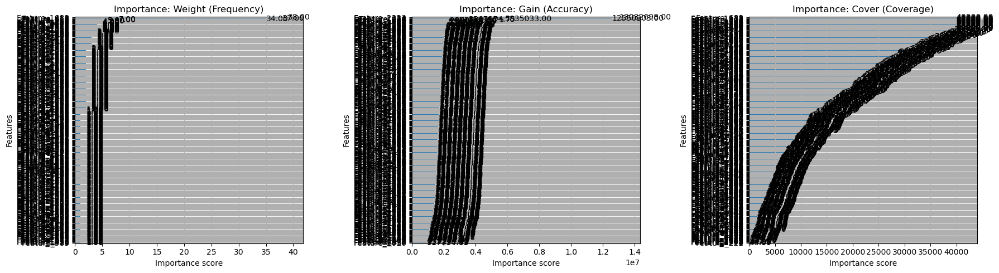

XGBoost Weight Importance: {'Feature_1236': 2.0, 'Feature_1297': 3.0, 'Feature_585': 1.0, 'Feature_1018': 1.0, 'Feature_496': 1.0, 'Feature_2115': 2.0, 'Feature_1051': 1.0, 'Feature_873': 1.0, 'Feature_874': 1.0, 'Feature_1801': 2.0, 'Feature_1816': 2.0, 'Feature_2121': 2.0, 'Feature_2234': 2.0, 'Feature_653': 1.0, 'Feature_1850': 2.0, 'Feature_2486': 3.0, 'Feature_2872': 1.0, 'Feature_899': 1.0, 'Feature_1244': 1.0, 'Feature_710': 2.0, 'Feature_2398': 1.0, 'Feature_1145': 1.0, 'Feature_1365': 1.0, 'Feature_598': 2.0, 'Feature_2455': 1.0, 'Feature_1009': 1.0, 'Feature_952': 1.0, 'Feature_447': 1.0, 'Feature_2729': 1.0, 'Feature_1302': 3.0, 'Feature_2532': 2.0, 'Feature_2987': 1.0, 'Feature_2698': 2.0, 'Feature_276': 1.0, 'Feature_750': 1.0, 'Feature_2835': 1.0, 'Feature_2191': 1.0, 'Feature_245': 2.0, 'Feature_374': 1.0, 'Feature_931': 3.0, 'Feature_2779': 1.0, 'Feature_219': 2.0, 'Feature_2': 1.0, 'Feature_439': 1.0, 'Feature_1039': 2.0, 'Feature_2126': 1.0, 'Feature_2608': 1.0, 'Feat

In [71]:

# 4. XGBoost Native Importances
important_weight_importance, important_gain_importance, important_cover_importance = plot_all_xgb_importances(model_important)

print("XGBoost Weight Importance:", important_weight_importance)
print("XGBoost Gain Importance:", important_gain_importance)
print("XGBoost Cover Importance:", important_cover_importance)


##### test XGBoost Native Importances results for important features

In [72]:

C = 0.0 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = important_weight_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing weight_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = important_gain_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing gain_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)

significant_features = important_cover_importance
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing cover_importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing weight_importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 21
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 18
Total Model Features Found:    151
--------------------------------------------------
True Positives (Correct): 5 -> ['Feature_2323', 'Feature_1683', 'Feature_818', 'Feature_418', 'Feature_1624']
False Positives (Noise):  146 -> ['Feature_1236', 'Feature_1297', 'Feature_2027', 'Feature_2271', 'Feature_1185', 'Feature_999', 'Feature_49', 'Feature_335', 'Feature_1023', 'Feature_1167', 'Feature_1896', 'Feature_2115', 'Feature_2938', 'Feature_1567', 'Feature_861', 'Feature_1986', 'Feature_1801', 'Feature_1408', 'Feature_1318', 'Feature_1816', 'Feature_2121', 'Feature_2521', 'Feature_602', 'Feature_2234', 'Feature_1850', 'Feature_1664', 'Feature_1963', 'Feature_809', 'Feature_2486', 'Feature_1030', 'Feature_1950', 'Feature_456', 'Feature_852', 'Feature_710', 'Feature_197', 'Feature_222', 'Feature_2025', 'Feature_1644', 'Feat

#### try to use SHAP to find the influencing inputs for important features

In [73]:

# 5. Explainability (SHAP)
start_time = time.time()
shap_values = compute_shap_values(model_important, X_train_important, X_test_important)
end_time = time.time()
print(f"Execution time: {end_time - start_time} seconds")


Execution time: 0.470958948135376 seconds


##### individual SHAP features ranking for important features

Plotting SHAP analysis for top 5 features: ['Feature_418', 'Feature_818', 'Feature_1683', 'Feature_910', 'Feature_1412']


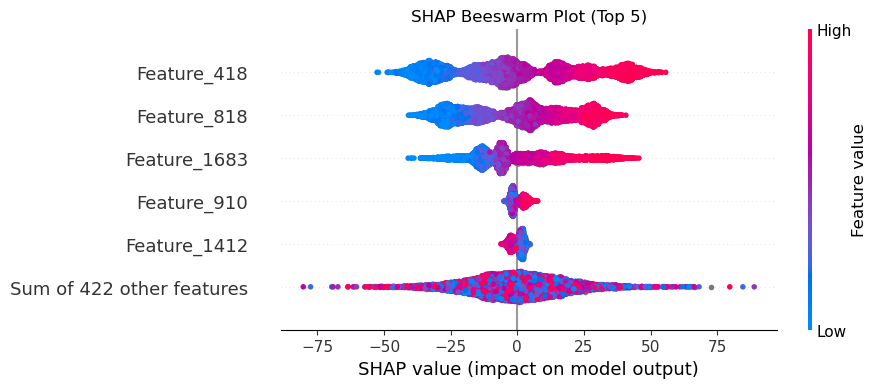

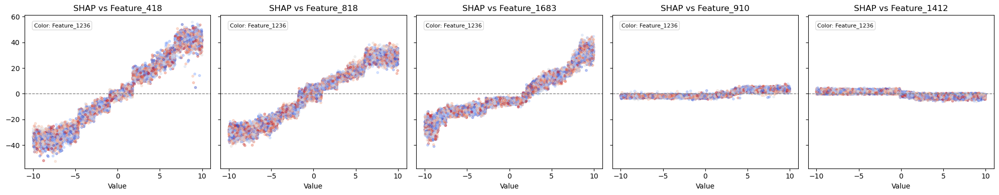

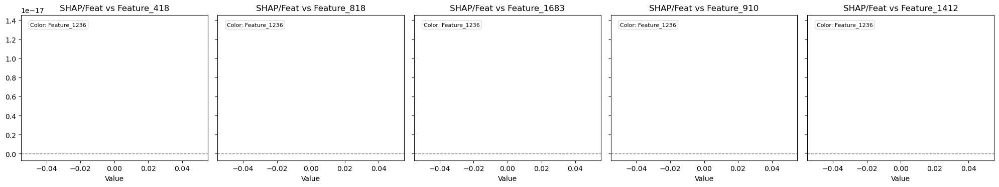

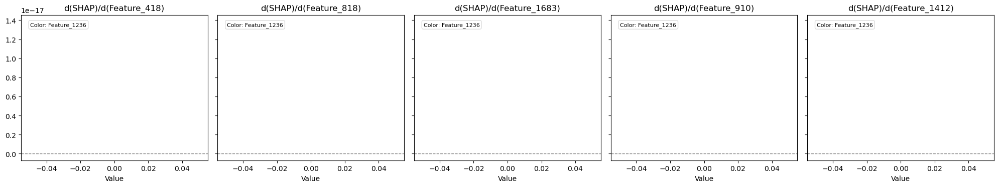

In [74]:

# 6. Visualization (SHAP)
plot_shap_analysis(shap_values, list(all_important_features))


##### SHAP summry for important features

In [75]:

# 8. Summary (SHAP)
ranked_features = print_feature_importance(shap_values)

print("Ranked Features by SHAP Importance:", ranked_features)



--- SHAP Feature Importance Ranking ---
SHAP Global Importance Dictionary:
  Feature_418: 21.1732
  Feature_818: 17.2401
  Feature_1683: 12.9412
  Feature_910: 2.0646
  Feature_1412: 1.8500
  Feature_511: 1.6569
  Feature_2451: 1.6420
  Feature_967: 1.6175
  Feature_716: 1.5925
  Feature_1567: 1.5715
  Feature_2499: 1.4967
  Feature_1986: 1.4859
  Feature_2896: 1.4489
  Feature_931: 1.3176
  Feature_2271: 1.1931
  Feature_1002: 1.1712
  Feature_1297: 1.1541
  Feature_754: 1.1521
  Feature_389: 1.1509
  Feature_207: 1.1334
  Feature_720: 1.1295
  Feature_724: 1.1082
  Feature_1302: 1.1000
  Feature_66: 1.0722
  Feature_1055: 1.0453
  Feature_2486: 1.0288
  Feature_2033: 1.0219
  Feature_1577: 1.0214
  Feature_2628: 0.9483
  Feature_2284: 0.9463
  Feature_1408: 0.9454
  Feature_1239: 0.9307
  Feature_743: 0.9288
  Feature_53: 0.9202
  Feature_2718: 0.9164
  Feature_638: 0.8957
  Feature_1388: 0.8891
  Feature_999: 0.8809
  Feature_2673: 0.8734
  Feature_2487: 0.8440
  Feature_1932: 0.83

##### test SHAP Importances results for important features

In [76]:
C = 0.0 # Adjust this constant to be more or less strict in filtering features based on standard deviation

significant_features = ranked_features
# get only values above the mean
significant_features = {k: v for k, v in significant_features.items() if v > np.mean(list(significant_features.values())) +C*np.std(list(significant_features.values()))}
significant_features 

print("Testing SHAP importance:")
metrics = evaluate_feature_discovery(significant_features, true_linear_weights, true_interaction_weights)



Testing SHAP importance:

           FEATURE DISCOVERY EVALUATION
Total True (Visible) Features: 21
  ├─ Purely Linear / Main:     3
  └─ Involved in Interactions: 18
Total Model Features Found:    112
--------------------------------------------------
True Positives (Correct): 7 -> ['Feature_2323', 'Feature_1683', 'Feature_818', 'Feature_1095', 'Feature_418', 'Feature_1624', 'Feature_2556']
False Positives (Noise):  105 -> ['Feature_2499', 'Feature_754', 'Feature_1236', 'Feature_2126', 'Feature_2451', 'Feature_986', 'Feature_1297', 'Feature_2027', 'Feature_2271', 'Feature_134', 'Feature_1185', 'Feature_1505', 'Feature_2083', 'Feature_999', 'Feature_1910', 'Feature_2982', 'Feature_49', 'Feature_638', 'Feature_1342', 'Feature_1313', 'Feature_2495', 'Feature_1349', 'Feature_2938', 'Feature_1567', 'Feature_1150', 'Feature_1442', 'Feature_2628', 'Feature_1388', 'Feature_1986', 'Feature_1408', 'Feature_2896', 'Feature_2521', 'Feature_602', 'Feature_2234', 'Feature_1222', 'Feature_1055', 'Fe